**DATA PREPARATION**

Remove the empty rows, make all the text lowercase, remove stop words, remove punctuation, stem the data, tokenize the data.

In [15]:
import string
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
import pandas as pd

nltk.download('punkt')
nltk.download('stopwords')
def remove_stop_words(text):
    if isinstance(text, str):
        stop_words = set(stopwords.words('english'))
        tokens = text.split()
        tokens = [word for word in tokens if word.lower() not in stop_words]
        return ' '.join(tokens)
    else:
        return text

def remove_punctuation(text):
    if isinstance(text, str):
        return text.translate(str.maketrans("", "", string.punctuation))
    else:
        return text

def tokenizeation_process(text):
    if isinstance(text, str):
        tokens = word_tokenize(text)
        return tokens
    return text

def stem_text(text):
    if isinstance(text, str):
        stemmer = PorterStemmer()
        tokens = word_tokenize(text)
        stemmed_tokens = [stemmer.stem(token) for token in tokens]
        return ' '.join(stemmed_tokens)
    else:
        return text

def process_text_columns(df, specified_columns):
    df = df.applymap(lambda x: x.lower() if isinstance(x, str) else x)
    df = df.applymap(lambda x: remove_stop_words(x) if isinstance(x,str) else x)
    df = df.applymap(lambda x: remove_punctuation(x) if isinstance(x,str) else x)
    df = df.applymap(lambda x: tokenizeation_process(stem_text(x)) if isinstance(x,str) else x)

    for col in specified_columns:
        if col in df.columns:
            df.dropna(subset=[col], inplace=True)
    return df

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


**ANSWERING THE 3 QUESTIONS**

Categorize the job titles: entry-level or mid_level

In [584]:
import pandas as pd

file_path = r"C:\Users\User\Desktop\CardoProject\education\raw data\Education, Training, and Experience Categories.xlsx"
df = pd.read_excel(file_path)

entry_level_range = (1, 6)

df['Level'] = 'mid'

entry_level_mask = (df['Category'] >= entry_level_range[0]) & (df['Category'] <= entry_level_range[1])
df.loc[entry_level_mask, 'Level'] = 'entry'

new_file_path = r"C:\Users\User\Desktop\CardoProject\education\categorized_positions.xlsx"
df.to_excel(new_file_path, index=False)

print(f"Categorized positions saved to: {new_file_path}")


Categorized positions saved to: C:\Users\User\Desktop\CardoProject\education\categorized_positions.xlsx


In [461]:
#Create a new file only with Jobs related to software
job_titles_file = r"C:\Users\User\Desktop\CardoProject\education\Education, Training, and Experience.xlsx"
df = pd.read_excel(job_titles_file)

software_keywords = ['software', 'programming', 'developer', 'engineer', 'coding', 'web', 'app', 'IT', 'system', 'program', 'network', 'application','administrator']

df['Title'] = df['Title'].str.lower()

software_related_titles = df[df['Title'].str.contains('|'.join(software_keywords), na=False)]

software_related_titles.to_excel(r"C:\Users\User\Desktop\CardoProject\education\software_related_titles.xlsx", index=False)
print(f"File created successfully")

File created successfully


In [463]:
#Since in this file in order to specify the level as entry/mid we need to take a look at Data Value and Category I have decided to delete the other numerical columns
df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\education\software_jobs_filtered.xlsx")

columns_to_delete = ["N", "Standard Error", "Lower CI Bound", "Upper CI Bound"]
df_filtered = df.drop(columns=columns_to_delete, errors='ignore')

df_filtered.to_excel(r"C:\Users\User\Desktop\CardoProject\education\software_jobs.xlsx", index=False)
print("File created successfully!")

File created successfully!


In [464]:
#Remove rows which have 0 in the "Data Value" column
df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\education\software_jobs.xlsx")
df_filtered = df[df['Data Value'] != 0]
df_filtered.to_excel(r"C:\Users\User\Desktop\CardoProject\education\cleaned_software_jobs.xlsx", index=False)
print("Preprocessing done! Check file!")

Preprocessing done! Check file!


In [469]:
#Here I am making sure I did not miss any job title by deleting the rows with the Data Value == 0 
df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\education\software_jobs.xlsx")
unique_values_count = df['Title'].nunique()
print(f"Number of unique values in software_jobs: {unique_values_count}")

Number of unique values in software_jobs: 21


In [470]:
df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\education\cleaned_software_jobs.xlsx")
unique_values_count = df['Title'].nunique()
print(f"Number of unique values in cleaned_software_jobs: {unique_values_count}")

Number of unique values in cleaned_software_jobs: 21


In [475]:
#group the data and then create a new column "Level" to define if they are entry/mid level. Skip rows where Scale ID is "im"
df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\education\cleaned_software_jobs.xlsx")
grouped_df = df.groupby(['Title', 'Scale ID'])

def divide_and_label(group):
    if 'IM' in group['Scale ID'].values:
        group['Level'] = 'Specialization'
    else:
        half_len = len(group) // 2
        group['Level'] = ['entry'] * half_len + ['mid'] * (len(group) - half_len)
    return group

df_result = grouped_df.apply(divide_and_label)

df_result.reset_index(drop=True, inplace=True)

df_result.to_excel(r"C:\Users\User\Desktop\CardoProject\education\labeled_software_jobs.xlsx", index = False)
print("File processed successfully!")

File processed successfully!


C:\Users\User\AppData\Local\Temp\ipykernel_5196\2001468141.py:13: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_result = grouped_df.apply(divide_and_label)


* **VISUALIZING SOME INFORMATION ABOUT SOFTWARE JOBS**

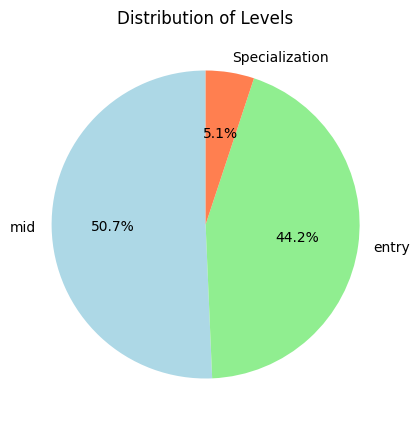

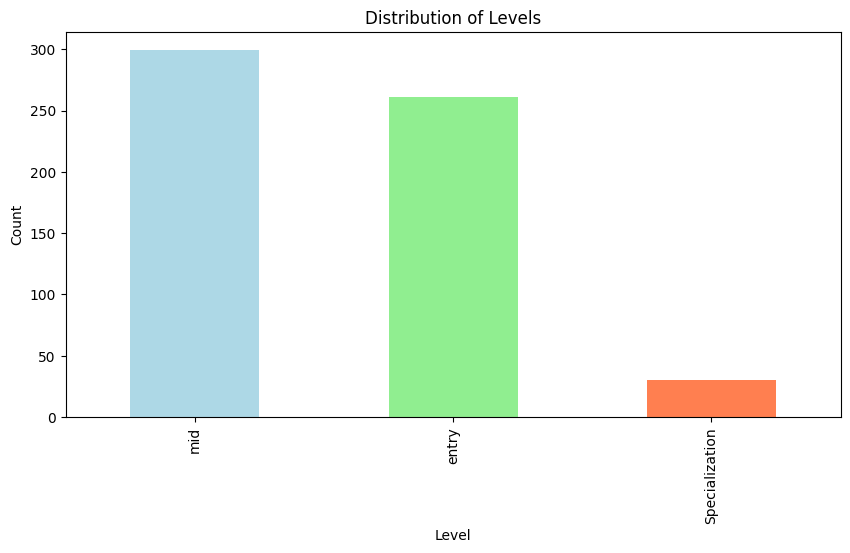

In [477]:
import matplotlib.pyplot as plt

level_counts = df_result['Level'].value_counts()
plt.figure(figsize=(5, 5))
plt.pie(level_counts, labels=level_counts.index, autopct='%1.1f%%', startangle=90, colors=['lightblue', 'lightgreen','coral'])
plt.title('Distribution of Levels')
plt.show()

plt.figure(figsize=(10, 5))
df_result['Level'].value_counts().plot(kind='bar', color=['lightblue', 'lightgreen', 'coral'])
plt.title('Distribution of Levels')
plt.xlabel('Level')
plt.ylabel('Count')
plt.show()

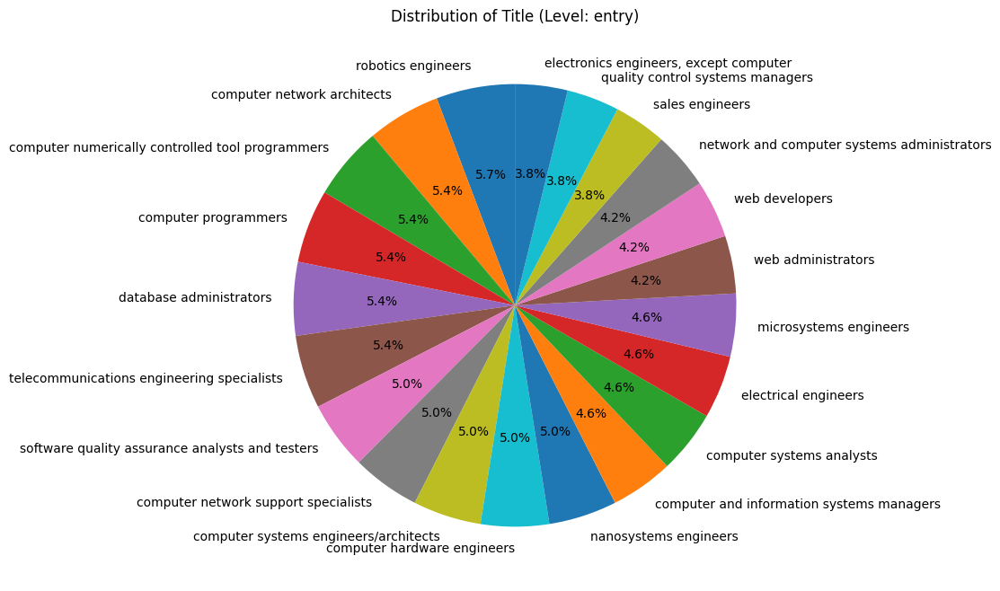

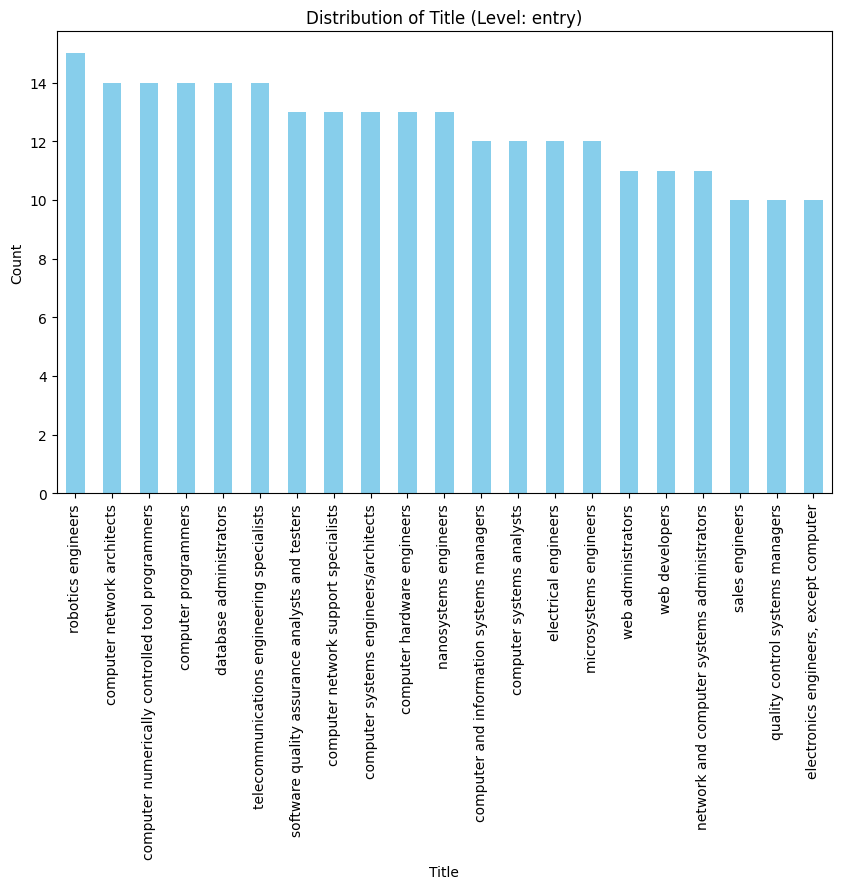

In [478]:
entry_level_df = df_result[df_result['Level'] == 'entry']

title_counts_entry = entry_level_df['Title'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(title_counts_entry, labels=title_counts_entry.index, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Title (Level: entry)')
plt.show()

plt.figure(figsize=(10, 6))
entry_level_df['Title'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Distribution of Title (Level: entry)')
plt.xlabel('Title')
plt.ylabel('Count')
plt.show()

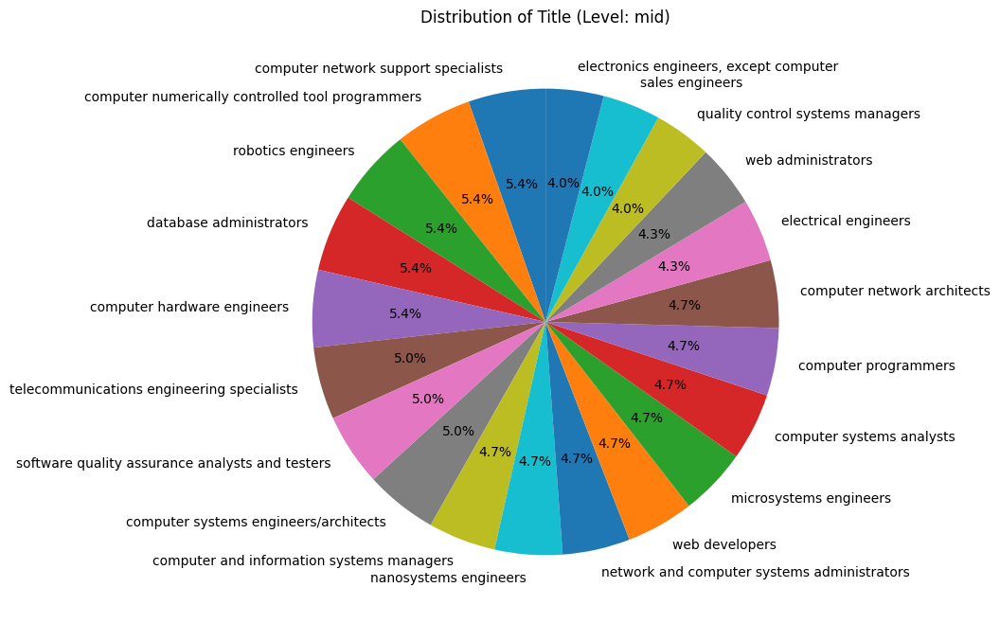

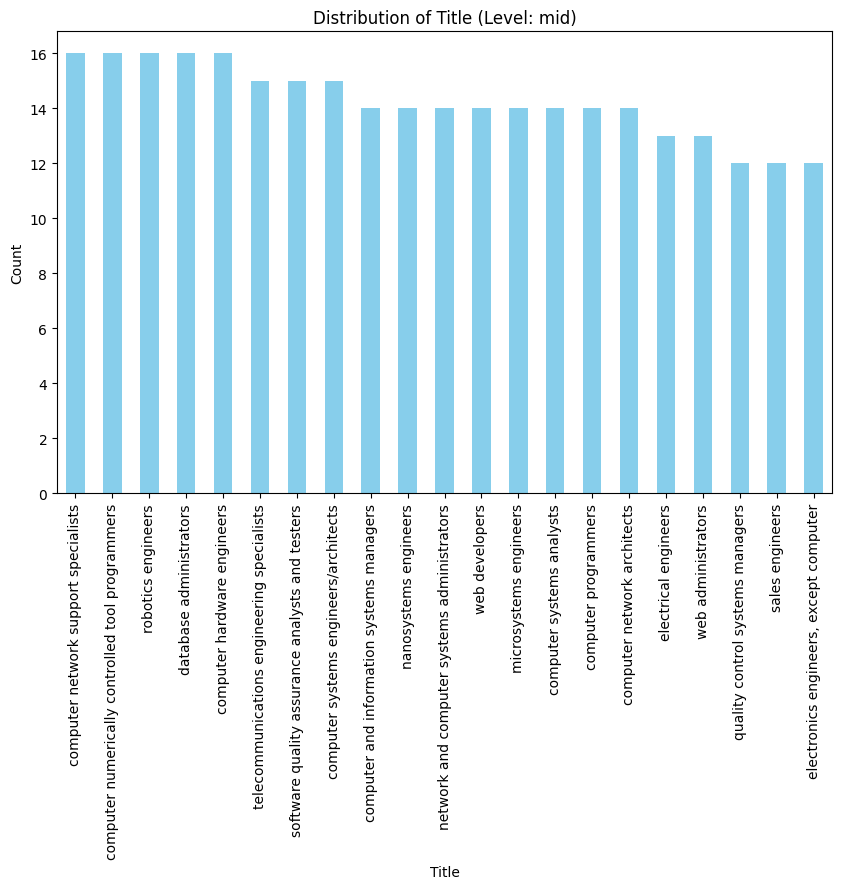

In [479]:
entry_level_df = df_result[df_result['Level'] == 'mid']

title_counts_entry = entry_level_df['Title'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(title_counts_entry, labels=title_counts_entry.index, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Title (Level: mid)')
plt.show()

plt.figure(figsize=(10, 6))
entry_level_df['Title'].value_counts().plot(kind='bar', color='skyblue')
plt.title('Distribution of Title (Level: mid)')
plt.xlabel('Title')
plt.ylabel('Count')
plt.show()

In [19]:
df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\education\labeled_software_jobs.xlsx")
grouped_df = df.groupby('Title')

def check_requirements(group):
    im_rows = group[group['Scale ID'] == 'IM']
    threshold = 2.5

    if len(im_rows) == 2:
        if (im_rows['Data Value'] > threshold).any() and (im_rows['Data Value'] <= threshold).any():
            more_important_element = im_rows.loc[im_rows['Data Value'].idxmax(), 'Element Name']
            print(f"To be an {group['Title'].iloc[0]}, {more_important_element} is more important!")

        elif (im_rows['Data Value'] > threshold).all():
            max_element = im_rows.loc[im_rows['Data Value'].idxmax(), 'Element Name']
            print(f"To be a {group['Title'].iloc[0]} both are important.")

        elif (im_rows['Data Value'] < threshold).all():
            max_element = im_rows.loc[im_rows['Data Value'].idxmax(), 'Element Name']
            print(f"To be a {group['Title'].iloc[0]} both are important but {max_element} is more valued.")

    elif len(im_rows) == 1:
        print(f"To be an {group['Title'].iloc[0]}, {im_rows['Element Name'].iloc[0]} is the only specialization you need.")
        
    elif len(im_rows) == 0:
        print(f"No specialization needed to be an {group['Title'].iloc[0]}.")

grouped_df.apply(check_requirements)

No specialization needed to be an computer and information systems managers.
To be a computer hardware engineers both are important but Job-Related Professional Certification is more valued.
To be an computer network architects, Job-Related Professional Certification is more important!
No specialization needed to be an computer network support specialists.
No specialization needed to be an computer numerically controlled tool programmers.
No specialization needed to be an computer programmers.
To be a computer systems analysts both are important but Job-Related Professional Certification is more valued.
To be an computer systems engineers/architects, Job-Related Professional Certification is more important!
To be a database administrators both are important but Apprenticeship is more valued.
To be a electrical engineers both are important but Job-Related Professional Certification is more valued.
To be a electronics engineers, except computer both are important but Apprenticeship is mo

C:\Users\User\AppData\Local\Temp\ipykernel_14640\3319699981.py:27: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



""


(-0.9, 0.7)

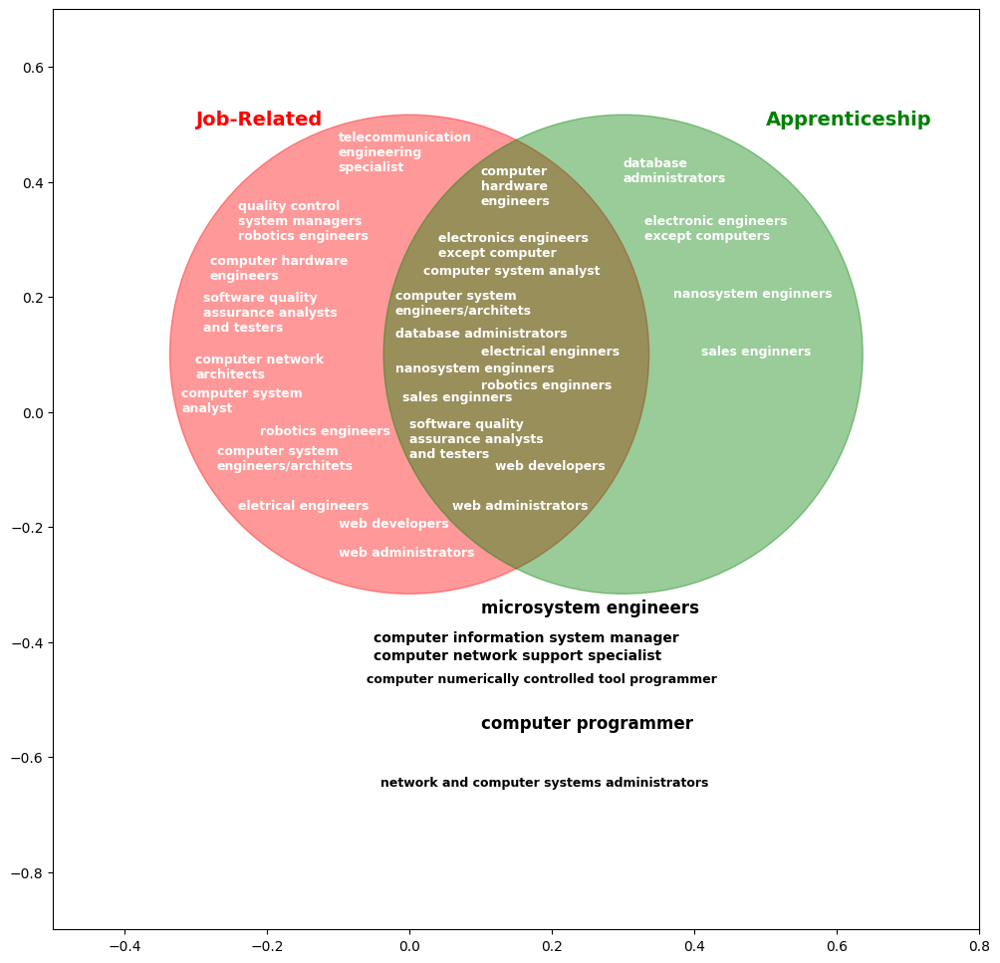

In [272]:
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(1,1,1)
plt.scatter(x=[0, 0.3], y=[0.1,0.1], s=120000, color=["red", "green"], alpha=0.4)
plt.text(x=-0.3, y=0.5, s="Job-Related", fontsize=14, fontweight="bold", color="red")
plt.text(x=0.5, y=0.5, s="Apprenticeship", fontsize=14, fontweight="bold", color="green")

plt.text(x=-0.05, y=-0.4, s="computer information system manager", fontsize=10, fontweight="bold", color="black")
plt.text(x=-0.05, y=-0.43, s="computer network support specialist", fontsize=10, fontweight="bold", color="black")
plt.text(x=-0.06, y=-0.47, s="computer numerically controlled tool programmer", fontsize=9, fontweight="bold", color="black")
plt.text(x=0.1, y=-0.55, s="computer programmer", fontsize=12, fontweight="bold", color="black")
plt.text(x=0.1, y=-0.35, s="microsystem engineers", fontsize=12, fontweight="bold", color="black")
plt.text(x=-0.04, y=-0.65, s="network and computer systems administrators", fontsize=9, fontweight="bold", color="black")

plt.text(x=-0.28, y=0.23, s="computer hardware\nengineers", fontsize=9, fontweight="bold", color="white")
plt.text(x=-0.3, y=0.06, s="computer network\narchitects", fontsize=9, fontweight="bold", color="white")
plt.text(x=-0.32, y=0, s="computer system\nanalyst", fontsize=9, fontweight="bold", color="white")
plt.text(x=-0.27, y=-0.1, s="computer system\nengineers/architets", fontsize=9, fontweight="bold", color="white")
plt.text(x=-0.24, y=-0.17, s="eletrical engineers", fontsize=9, fontweight="bold", color="white")
plt.text(x=-0.24, y=0.3, s="quality control\nsystem managers\nrobotics engineers", fontsize=9, fontweight="bold", color="white")
plt.text(x=-0.29, y=0.14, s="software quality\nassurance analysts\nand testers", fontsize=9, fontweight="bold", color="white")
plt.text(x=-0.1, y=0.42, s="telecommunication\nengineering\nspecialist", fontsize=9, fontweight="bold", color="white")
plt.text(x=-0.21, y=-0.04, s="robotics engineers", fontsize=9, fontweight="bold", color="white")
plt.text(x=-0.1, y=-0.2, s="web developers", fontsize=9, fontweight="bold", color="white")
plt.text(x=-0.1, y=-0.25, s="web administrators", fontsize=9, fontweight="bold", color="white")


plt.text(x=0.3, y=0.4, s="database\nadministrators", fontsize=9, fontweight="bold", color="white")
plt.text(x=0.33, y=0.3, s="electronic engineers\nexcept computers", fontsize=9, fontweight="bold", color="white")
plt.text(x=0.37, y=0.2, s="nanosystem enginners", fontsize=9, fontweight="bold", color="white")
plt.text(x=0.41, y=0.1, s="sales enginners", fontsize=9, fontweight="bold", color="white")

plt.text(x=0.1, y=0.36, s="computer\nhardware\nengineers", fontsize=9, fontweight="bold", color="white")
plt.text(x=0.04, y=0.27, s="electronics engineers\nexcept computer", fontsize=9, fontweight="bold", color="white")
plt.text(x=0.02, y=0.24, s="computer system analyst", fontsize=9, fontweight="bold", color="white")
plt.text(x=-0.02, y=0.17, s="computer system\nengineers/architets", fontsize=9, fontweight="bold", color="white")
plt.text(x=-0.02, y=0.13, s="database administrators", fontsize=9, fontweight="bold", color="white")
plt.text(x=0.1, y=0.1, s="electrical enginners", fontsize=9, fontweight="bold", color="white")
plt.text(x=-0.02, y=0.07, s="nanosystem enginners", fontsize=9, fontweight="bold", color="white")
plt.text(x=0.1, y=0.04, s="robotics enginners", fontsize=9, fontweight="bold", color="white")
plt.text(x=-0.01, y=0.02, s="sales enginners", fontsize=9, fontweight="bold", color="white")
plt.text(x=0, y=-0.08, s="software quality\nassurance analysts\nand testers", fontsize=9, fontweight="bold", color="white")
plt.text(x=0.12, y=-0.1, s="web developers", fontsize=9, fontweight="bold", color="white")
plt.text(x=0.06, y=-0.17, s="web administrators", fontsize=9, fontweight="bold", color="white")

plt.xlim(-0.5,0.8)
plt.ylim(-0.9, 0.7)

* **CREATING THE FILES RELATED TO SOFTWARE JOBS**


In [429]:
#Create a new file with only related to software jobs
def filter_and_create_file(software_jobs_file, abilities_file, output_file):
    software_jobs_df = pd.read_excel(software_jobs_file)
    unique_titles = software_jobs_df['Title'].str.lower().unique()

    abilities_df = pd.read_excel(abilities_file)
    abilities_df['Title'] = abilities_df['Title'].str.lower()

    filtered_abilities_df = abilities_df[abilities_df['Title'].isin(unique_titles)]
    filtered_abilities_df.to_excel(output_file, index=False)

In [491]:
software_jobs_file_path = r"C:\Users\User\Desktop\CardoProject\education\labeled_software_jobs.xlsx"
abilities_file_path = r"C:\Users\User\Desktop\CardoProject\abilities\raw data\Abilities.xlsx"
output_file_path = r"C:\Users\User\Desktop\CardoProject\abilities\software_Abilities.xlsx"

filter_and_create_file(software_jobs_file_path, abilities_file_path, output_file_path)

In [453]:
software_jobs_file_path = r"C:\Users\User\Desktop\CardoProject\education\labeled_software_jobs.xlsx"
skills_file_path = r"C:\Users\User\Desktop\CardoProject\skills\raw data\Skills.xlsx"
output_file_path = r"C:\Users\User\Desktop\CardoProject\skills\software_Skills.xlsx"

filter_and_create_file(software_jobs_file_path, skills_file_path, output_file_path)

In [498]:
software_jobs_file_path = r"C:\Users\User\Desktop\CardoProject\education\labeled_software_jobs.xlsx"
techSkills_file_path = r"C:\Users\User\Desktop\CardoProject\techSkills\raw data\Technology Skills.xlsx"
output_file_path = r"C:\Users\User\Desktop\CardoProject\techSkills\software_Technologies.xlsx"

filter_and_create_file(software_jobs_file_path, techSkills_file_path, output_file_path)

In [510]:
software_jobs_file_path = r"C:\Users\User\Desktop\CardoProject\education\labeled_software_jobs.xlsx"
knowledge_file_path = r"C:\Users\User\Desktop\CardoProject\knowledges\raw data\Knowledge.xlsx"
output_file_path = r"C:\Users\User\Desktop\CardoProject\knowledges\software_Knowledges.xlsx"

filter_and_create_file(software_jobs_file_path, knowledge_file_path, output_file_path)

In [579]:
software_jobs_file_path = r"C:\Users\User\Desktop\CardoProject\education\labeled_software_jobs.xlsx"
tools_file_path = r"C:\Users\User\Desktop\CardoProject\techSkills\raw data\Tools Used.xlsx"
output_file_path = r"C:\Users\User\Desktop\CardoProject\techSkills\software_Tools.xlsx"

filter_and_create_file(software_jobs_file_path, tools_file_path, output_file_path)

In [638]:
software_jobs_file_path = r"C:\Users\User\Desktop\CardoProject\education\labeled_software_jobs.xlsx"
activities_file_path = r"C:\Users\User\Desktop\CardoProject\workActivities\raw data\Work Activities.xlsx"
output_file_path = r"C:\Users\User\Desktop\CardoProject\workActivities\software_Activities.xlsx"

filter_and_create_file(software_jobs_file_path, activities_file_path, output_file_path)

* **Eleminate rows with Scale ID == LV from all the software related files**

In [520]:
#A function which eleminates the rows with "LV" as a Scale ID
def eliminate_rows(file_path, scale_id_to_eliminate):
    df = pd.read_excel(file_path)
    updated_df = df[df['Scale ID'] != scale_id_to_eliminate]
    return updated_df

In [521]:
file = r"C:\Users\User\Desktop\CardoProject\skills\software_Skills.xlsx"
skills_df = eliminate_rows(file, "LV")
skills_df.to_excel(r"C:\Users\User\Desktop\CardoProject\skills\software_Skills_updated.xlsx", index=False)

In [637]:
file = r"C:\Users\User\Desktop\CardoProject\abilities\software_Abilities.xlsx"
abilities_df = eliminate_rows(file, "LV")
abilities_df.to_excel(r"C:\Users\User\Desktop\CardoProject\abilities\software_Abilities_updated.xlsx", index=False)

In [636]:
file = r"C:\Users\User\Desktop\CardoProject\knowledges\software_Knowledges.xlsx"
knowledges_df = eliminate_rows(file, "LV")
knowledges_df.to_excel(r"C:\Users\User\Desktop\CardoProject\knowledges\software_Knowledges_updated.xlsx", index=False)

In [639]:
file = r"C:\Users\User\Desktop\CardoProject\workActivities\software_Activities.xlsx"
activities_df = eliminate_rows(file, "LV")
activities_df.to_excel(r"C:\Users\User\Desktop\CardoProject\workActivities\software_Activities_updated.xlsx", index=False)

¬ **Answering the first question:**
*What are the key differences in skills and competences between entry level and mid level programmers?*

In [593]:
labeled_software_jobs = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\education\labeled_software_jobs.xlsx")
categorized_positions = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\education\categorized_positions.xlsx")

grouped_labeled_jobs = labeled_software_jobs.groupby(["Scale ID", "Category"])
grouped_categorized_positions = categorized_positions.groupby(["Scale ID", "Category"])

labeled_software_jobs["Certificate"] = ""

for index, row in labeled_software_jobs.iterrows():
    scale_id = row["Scale ID"]
    category = row["Category"]
    
    match = categorized_positions[
        (categorized_positions["Scale ID"] == scale_id) & (categorized_positions["Category"] == category)
    ]
    
    if not match.empty:
        labeled_software_jobs.at[index, "Certificate"] = match["Category Description"].iloc[0]

labeled_software_jobs.to_excel(r"C:\Users\User\Desktop\CardoProject\education\labeled_software_jobs.xlsx", index=False)
print("File created successfully!")

File created successfully!


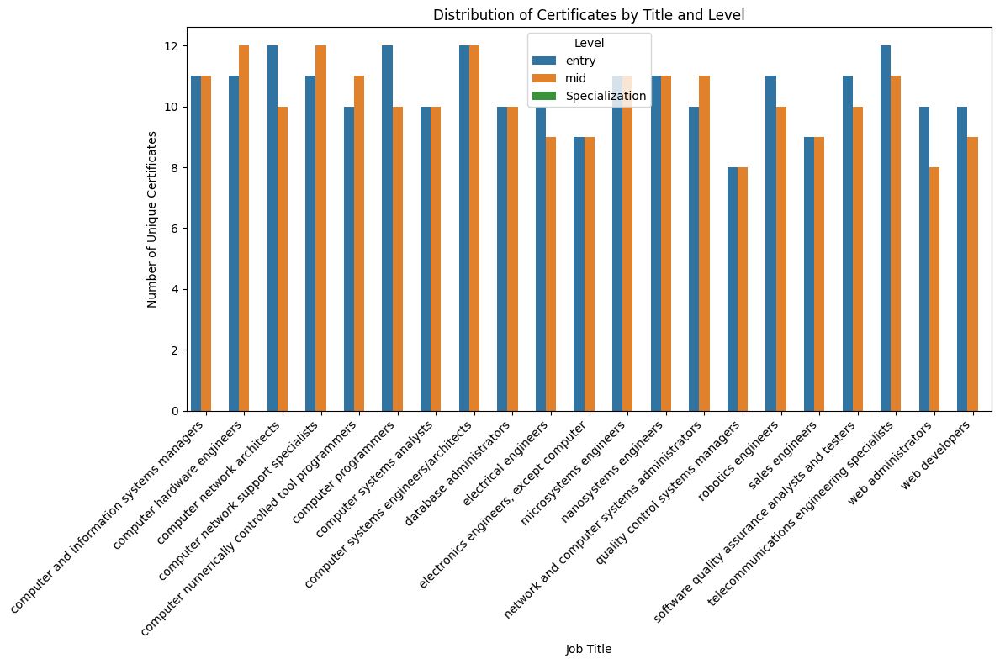

In [595]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\education\labeled_software_jobs.xlsx")

grouped_df = df.groupby(["Title", "Level"])["Certificate"].nunique().reset_index()

plt.figure(figsize=(12, 8))
sns.barplot(x="Title", y="Certificate", hue="Level", data=grouped_df)
plt.title("Distribution of Certificates by Title and Level")
plt.xlabel("Job Title")
plt.ylabel("Number of Unique Certificates")
plt.xticks(rotation=45, ha="right")
plt.legend(title="Level")
plt.tight_layout()
plt.show()


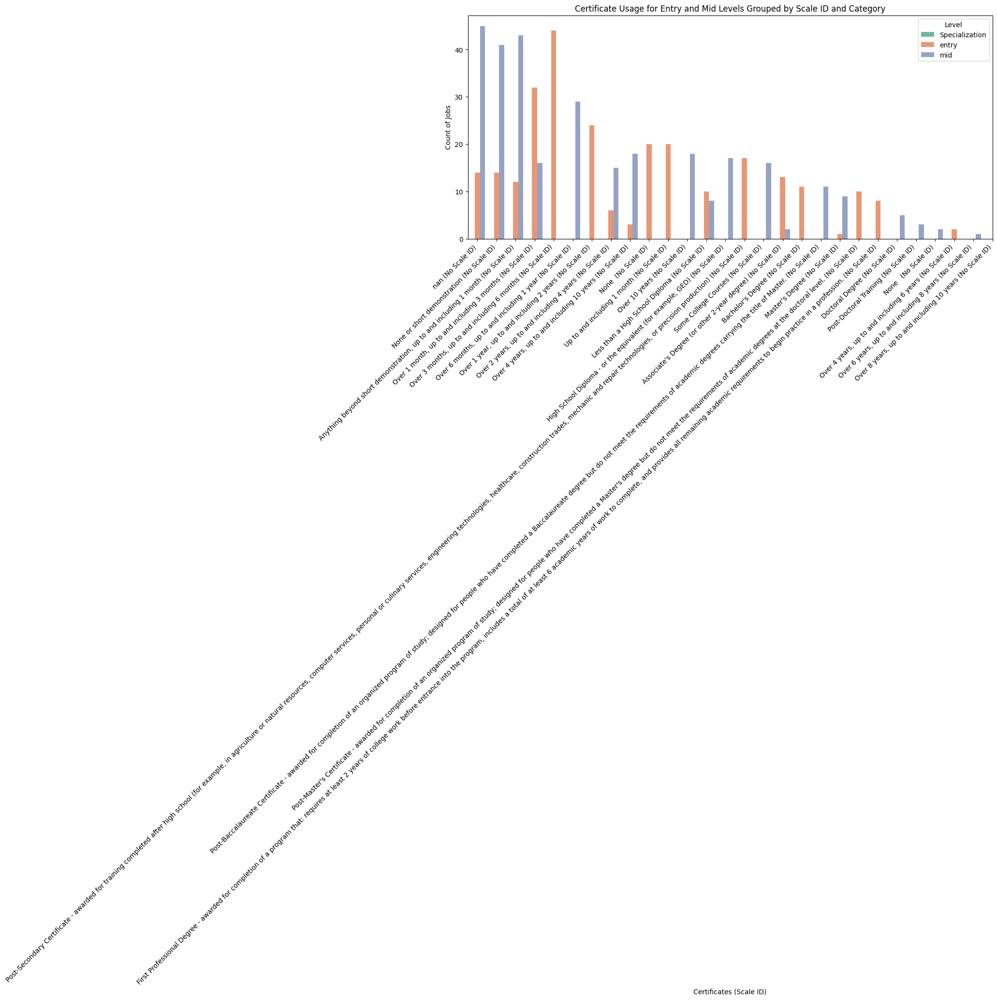

21


In [315]:
import seaborn as sns

df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\education\labeled_software_jobs.xlsx")

plt.figure(figsize=(14, 6))
df_sorted = df.sort_values(by=['Scale ID', 'Category'])

ax = sns.countplot(x='Certificate', hue='Level', data=df_sorted, palette='Set2',
                   order=df_sorted['Certificate'].value_counts().index)

scale_ids = df_sorted.groupby('Scale ID')['Scale ID'].first().to_dict()
unique_certificates = df_sorted['Certificate'].unique()
labels = [f'{cert} ({scale_ids.get(cert, "No Scale ID")})' for cert in unique_certificates]

ax.set_xticks(range(len(unique_certificates)))
ax.set_xticklabels(labels, rotation=45, ha="right")

plt.title("Certificate Usage for Entry and Mid Levels Grouped by Scale ID and Category")
plt.xlabel("Certificates (Scale ID)")
plt.ylabel("Count of Jobs")
plt.legend(title="Level")
plt.show()

titles = df['Title'].unique()
print(len(titles))

¬ **Answering the second question:** *What non-technical skills are most frequently needed in programming job descriptions?*

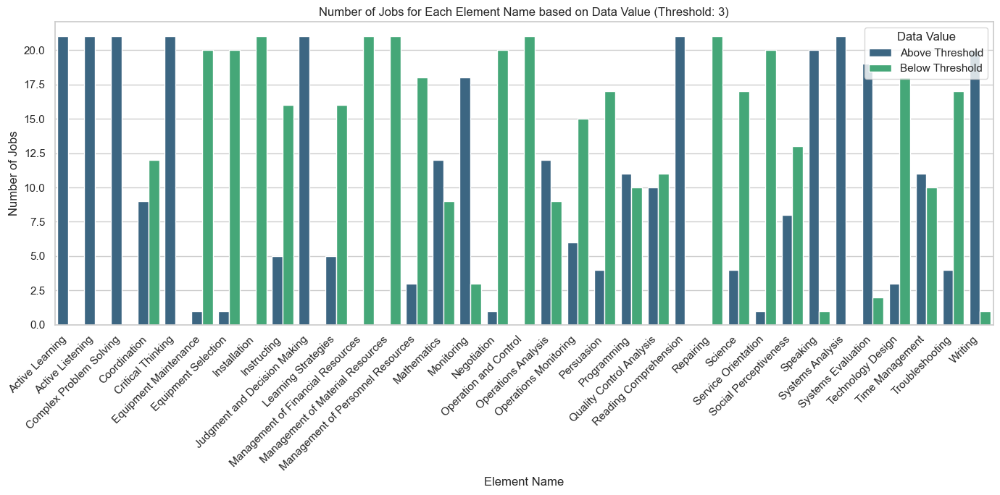

In [693]:
import seaborn as sns

threshold= 3

df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\skills\software_Skills_updated.xlsx")
df['Data Value'] = df['Data Value'].apply(lambda x: 'Above Threshold' if x > threshold else 'Below Threshold')

grouped_df = df.groupby(['Element Name', 'Data Value']).size().unstack(fill_value=0)
grouped_df = grouped_df.reset_index()

melted_df = pd.melt(grouped_df, id_vars=['Element Name'], var_name='Data Value', value_name='Number of Jobs')
sns.set(style="whitegrid")

plt.figure(figsize=(14, 7))
sns.barplot(x='Element Name', y='Number of Jobs', hue='Data Value', data=melted_df, palette='viridis')
plt.xlabel('Element Name')
plt.ylabel('Number of Jobs')
plt.title(f'Number of Jobs for Each Element Name based on Data Value (Threshold: {threshold})')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

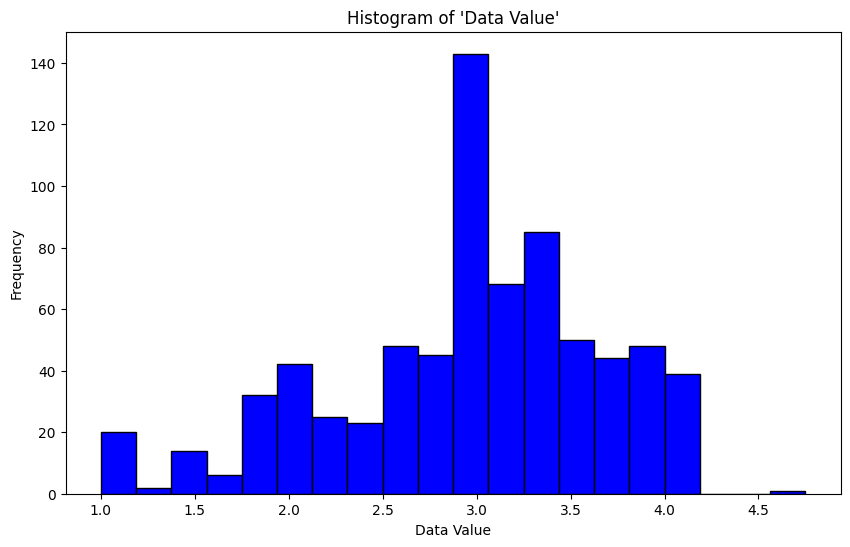

In [304]:
import pandas as pd
import matplotlib.pyplot as plt

file_path = r"C:\Users\User\Desktop\CardoProject\skills\software_Skills_updated.xlsx"
df = pd.read_excel(file_path)

data_values = df["Data Value"]

plt.figure(figsize=(10, 6))
plt.hist(data_values, bins=20, color='blue', edgecolor='black')

plt.title("Histogram of 'Data Value'")
plt.xlabel("Data Value")
plt.ylabel("Frequency")
plt.show()


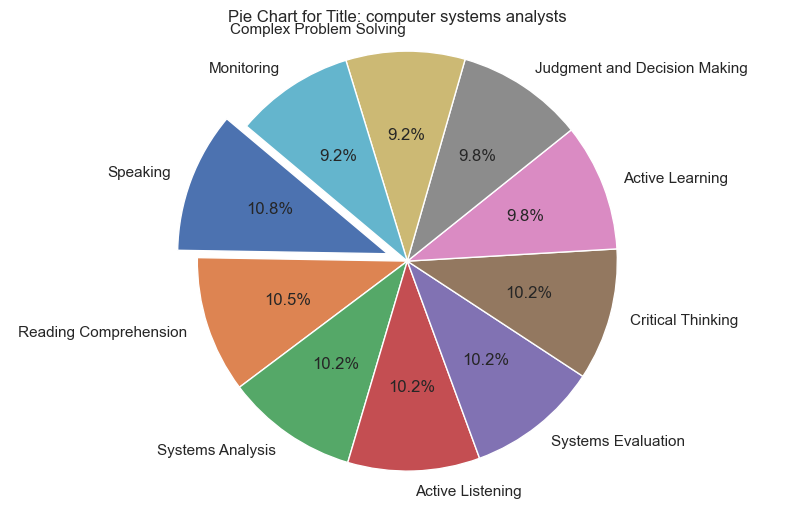

In [633]:
def pie_chart_for_title(title):
    df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\skills\software_Skills_updated.xlsx")

    title_df = df[df['Title'] == title]
    title_df = title_df.sort_values(by='Data Value', ascending=False).head(10)

    num_sections = len(title_df)

    explode = tuple(0.1 if i == 0 else 0 for i in range(num_sections))
    
    plt.figure(figsize=(10, 6))
    plt.pie(title_df['Data Value'], labels=title_df['Element Name'], autopct='%1.1f%%', startangle=140, explode = explode)
    plt.title(f'Pie Chart for Title: {title}')
    plt.axis('equal') 
    plt.show()

pie_chart_for_title("computer systems analysts")



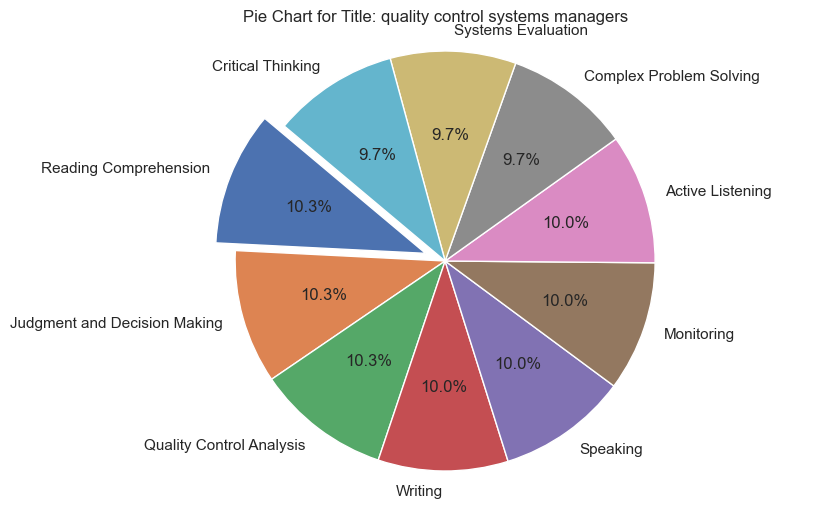

In [632]:
pie_chart_for_title("quality control systems managers")

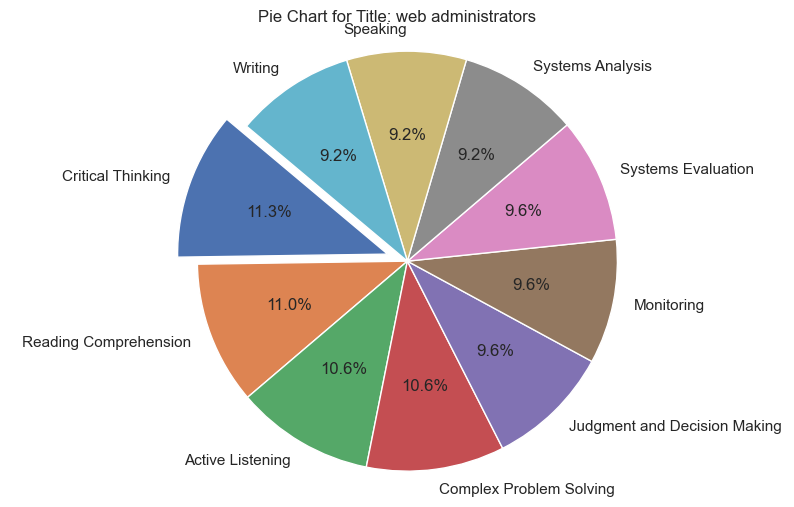

In [631]:
pie_chart_for_title("web administrators")

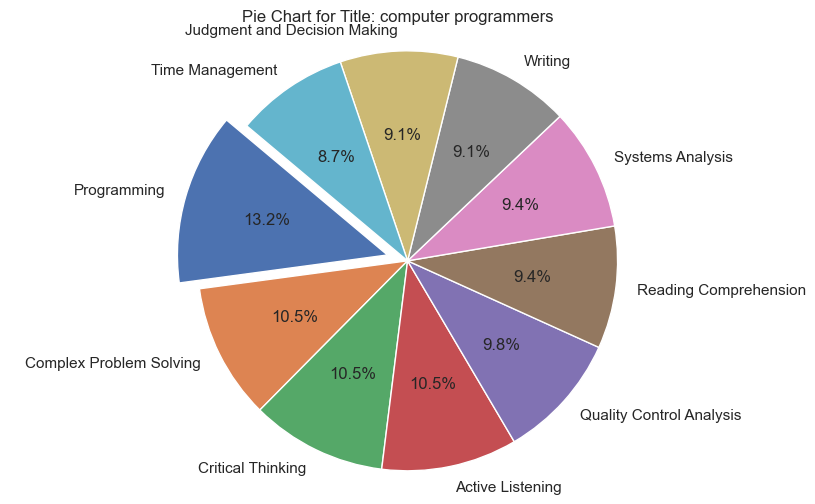

In [655]:
pie_chart_for_title("computer programmers")

¬ **Answering the third question:**
*What are the emerging technologies in the programming field?*

* * **Most required Technology Skills**

In [502]:
df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\techSkills\software_Technologies.xlsx")

emerging_technologies_df = df[(df['Hot Technology'] == 'Y') & (df['In Demand'] == 'Y')]

emerging_technologies_df.to_excel(r"C:\Users\User\Desktop\CardoProject\techSkills\emerging_technologies.xlsx", index=False)
print("File 'emerging_technologies.xlsx' created successfully!")

File 'emerging_technologies.xlsx' created successfully!


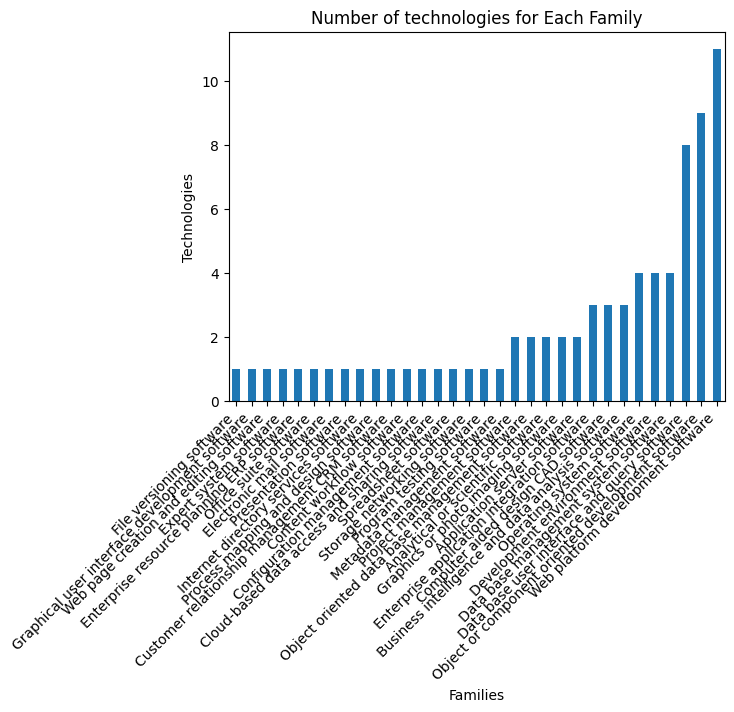

In [300]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\techSkills\emerging_technologies.xlsx")
grouped_df = df.groupby('Commodity Title')['Example'].nunique()
grouped_df_sorted = grouped_df.sort_values()

grouped_df_sorted.plot(kind='bar')
plt.title('Number of technologies for Each Family')
plt.xlabel('Families')
plt.ylabel('Technologies')
plt.xticks(rotation=45, ha='right')
plt.show()

In [559]:
def print_technologies_for_commodity_title(desired_title):
    df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\techSkills\emerging_Technologies.xlsx")

    desired_commodity_title = desired_title 

    filtered_df = df[df['Commodity Title'] == desired_commodity_title]
    unique_examples = filtered_df['Example'].unique()

    print(f"All Unique Examples for Commodity Title '{desired_commodity_title}':")
    for example in unique_examples:
        print(example)

In [560]:
print_technologies_for_commodity_title("Web platform development software")

All Unique Examples for Commodity Title 'Web platform development software':
JavaScript
Cascading style sheets CSS
Google Angular
Hypertext markup language HTML
Bootstrap
JavaScript Object Notation JSON
Node.js
PHP
React
Vue.js
Drupal


In [658]:
print_technologies_for_commodity_title("Object or component oriented development software")

All Unique Examples for Commodity Title 'Object or component oriented development software':
Oracle Java
Python
R
Scala
C#
C++
jQuery
TypeScript
Perl


In [659]:
print_technologies_for_commodity_title("Data base user interface and query software")

All Unique Examples for Commodity Title 'Data base user interface and query software':
Amazon Web Services AWS software
Structured query language SQL
Amazon Redshift
Apache Hive
Microsoft Access
Microsoft SQL Server
MySQL
Oracle Database


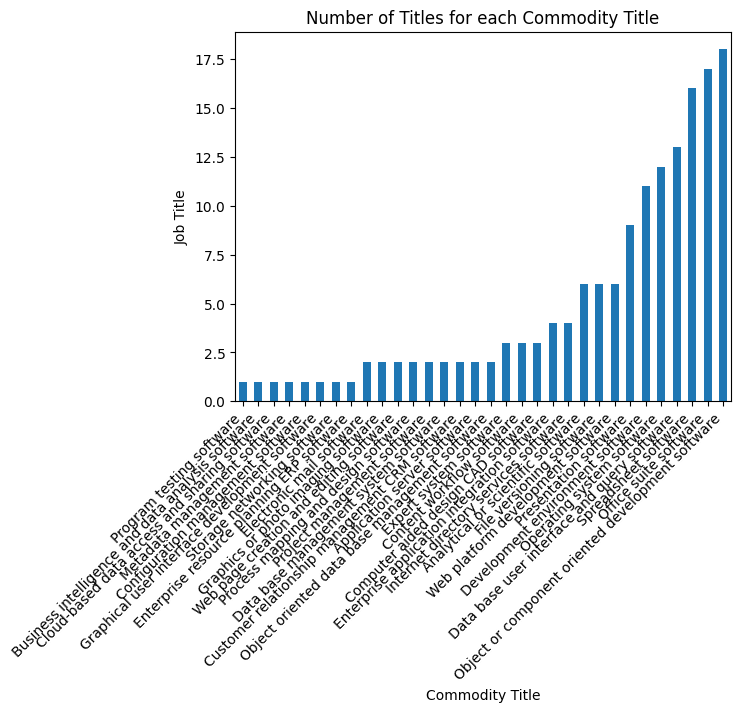

In [25]:
df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\techSkills\emerging_technologies.xlsx")
grouped_df = df.groupby('Commodity Title')['Title'].nunique()
grouped_df_sorted = grouped_df.sort_values()


grouped_df_sorted.plot(kind='bar')
plt.title('Number of Titles for each Commodity Title')
plt.xlabel('Commodity Title')
plt.ylabel('Job Title')
plt.xticks(rotation=45, ha='right')
plt.show()

In [661]:
def print_jobs_for_commodity_title(desired_title):
    df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\techSkills\emerging_Technologies.xlsx")

    desired_commodity_title = desired_title 

    filtered_df = df[df['Commodity Title'] == desired_commodity_title]
    unique_examples = filtered_df['Title'].unique()

    print(f"All Unique Job Titles for job '{desired_commodity_title}':")
    for example in unique_examples:
        print(example)

In [662]:
print_jobs_for_commodity_title("Object or component oriented development software")

All Unique Job Titles for job 'Object or component oriented development software':
computer and information systems managers
computer systems analysts
computer network support specialists
computer network architects
telecommunications engineering specialists
database administrators
network and computer systems administrators
computer programmers
software quality assurance analysts and testers
web developers
web administrators
computer systems engineers/architects
computer hardware engineers
electrical engineers
electronics engineers, except computer
microsystems engineers
robotics engineers
sales engineers


In [663]:
print_jobs_for_commodity_title("Office suite software")

All Unique Job Titles for job 'Office suite software':
computer and information systems managers
quality control systems managers
computer systems analysts
computer network support specialists
computer network architects
telecommunications engineering specialists
database administrators
network and computer systems administrators
computer programmers
software quality assurance analysts and testers
web administrators
computer systems engineers/architects
electrical engineers
electronics engineers, except computer
robotics engineers
sales engineers
computer numerically controlled tool programmers


In [664]:
print_jobs_for_commodity_title("Spreadsheet software")

All Unique Job Titles for job 'Spreadsheet software':
computer and information systems managers
quality control systems managers
computer systems analysts
computer network support specialists
computer network architects
telecommunications engineering specialists
database administrators
network and computer systems administrators
computer programmers
software quality assurance analysts and testers
web administrators
electrical engineers
electronics engineers, except computer
robotics engineers
sales engineers
computer numerically controlled tool programmers


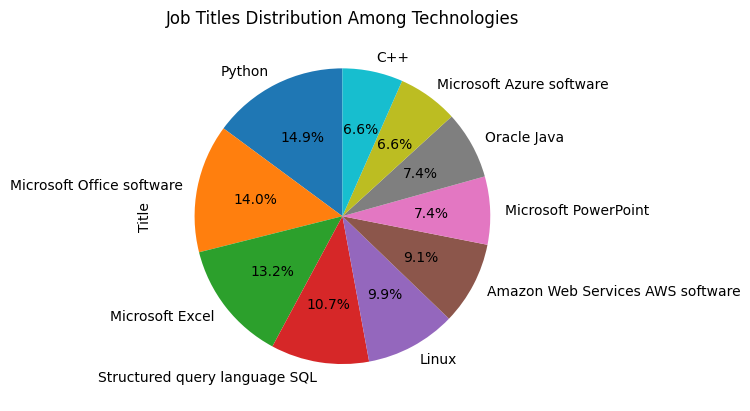

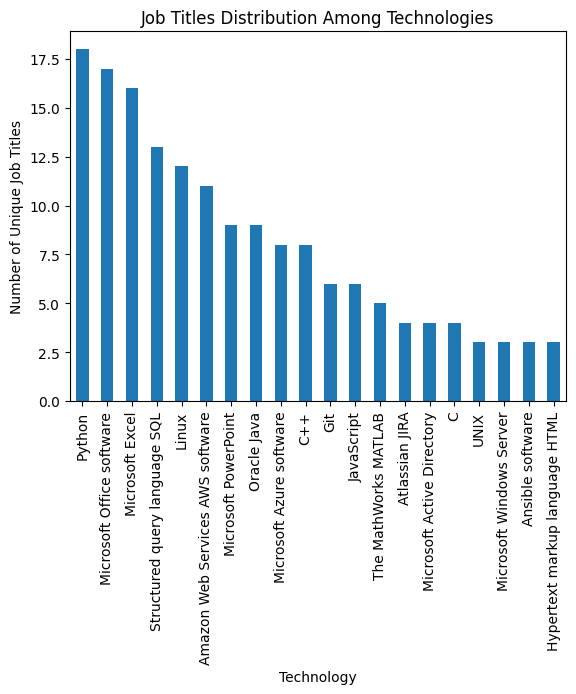

In [547]:
#Here are shown the technologies that are used on more job titles.
df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\techSkills\emerging_Technologies.xlsx")

grouped_df = df.groupby('Example')['Title'].nunique()
sorted_grouped_df = grouped_df.sort_values(ascending=False)

pie_chart_data = sorted_grouped_df.head(10)
pie_chart_data.plot(kind='pie', autopct='%1.1f%%', startangle=90)
plt.title('Job Titles Distribution Among Technologies')
plt.show()

bar_chart_data = sorted_grouped_df.head(20)
bar_chart_data.plot(kind='bar')
plt.title('Job Titles Distribution Among Technologies')
plt.xlabel('Technology')
plt.ylabel('Number of Unique Job Titles')
plt.show()



In [572]:
def print_job_for_techs(desired_title):
    df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\techSkills\emerging_Technologies.xlsx")

    desired_commodity_title = desired_title 

    filtered_df = df[df['Example'] == desired_commodity_title]
    unique_examples = filtered_df['Title'].unique()

    print(f"All Jobs requiring '{desired_commodity_title}':")
    for example in unique_examples:
        print(example)

In [573]:
print_job_for_techs("Python")

All Jobs requiring 'Python':
computer and information systems managers
computer systems analysts
computer network support specialists
computer network architects
telecommunications engineering specialists
database administrators
network and computer systems administrators
computer programmers
software quality assurance analysts and testers
web developers
web administrators
computer systems engineers/architects
computer hardware engineers
electrical engineers
electronics engineers, except computer
microsystems engineers
robotics engineers
sales engineers


In [665]:
print_job_for_techs("Microsoft Office software")

All Jobs requiring 'Microsoft Office software':
computer and information systems managers
quality control systems managers
computer systems analysts
computer network support specialists
computer network architects
telecommunications engineering specialists
database administrators
network and computer systems administrators
computer programmers
software quality assurance analysts and testers
web administrators
computer systems engineers/architects
electrical engineers
electronics engineers, except computer
robotics engineers
sales engineers
computer numerically controlled tool programmers


In [666]:
print_job_for_techs("Microsoft Excel")

All Jobs requiring 'Microsoft Excel':
computer and information systems managers
quality control systems managers
computer systems analysts
computer network support specialists
computer network architects
telecommunications engineering specialists
database administrators
network and computer systems administrators
computer programmers
software quality assurance analysts and testers
web administrators
electrical engineers
electronics engineers, except computer
robotics engineers
sales engineers
computer numerically controlled tool programmers


In [574]:
def print_techs_for_job(desired_title):
    df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\techSkills\emerging_Technologies.xlsx")

    desired_commodity_title = desired_title 

    filtered_df = df[df['Title'] == desired_commodity_title]
    unique_examples = filtered_df['Example'].unique()

    print(f"All Technologies required by '{desired_commodity_title}':")
    for example in unique_examples:
        print(example)

In [576]:
print_techs_for_job("database administrators")

All Technologies required by 'database administrators':
Amazon Redshift
Amazon Simple Storage Service S3
Amazon Web Services AWS software
Apache Hadoop
Apache Hive
Apache Kafka
Apache Spark
Git
Informatica software
Linux
Microsoft Access
Microsoft Azure software
Microsoft Excel
Microsoft Office software
Microsoft Power BI
Microsoft SQL Server
Microsoft SQL Server Integration Services SSIS
MySQL
NoSQL
Oracle Database
Oracle Java
Oracle PL/SQL
PostgreSQL
Python
R
Salesforce software
Scala
Structured query language SQL
Tableau
Transact-SQL
UNIX


* * **Most required technologies (tools)**

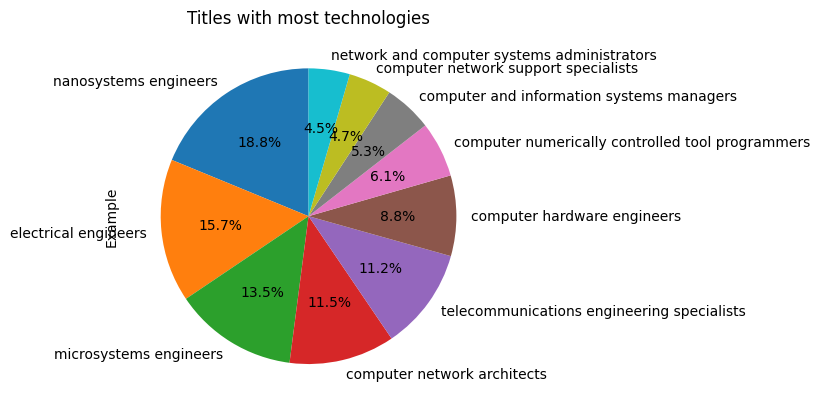

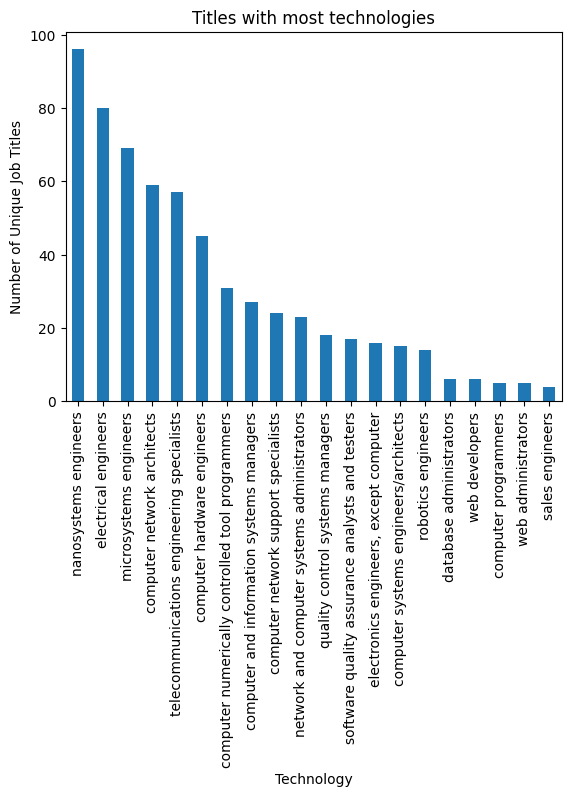

In [580]:
df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\techSkills\software_Tools.xlsx")

grouped_df = df.groupby('Title')['Example'].nunique()
sorted_grouped_df = grouped_df.sort_values(ascending=False)

pie_chart_data = sorted_grouped_df.head(10)
pie_chart_data.plot(kind='pie', autopct='%1.1f%%', startangle=90)
plt.title('Titles with most technologies')
plt.show()
bar_chart_data = sorted_grouped_df.head(20)
bar_chart_data.plot(kind='bar')
plt.title('Titles with most technologies')
plt.xlabel('Technology')
plt.ylabel('Number of Unique Job Titles')
plt.show()

In [673]:
def print_tools_for_job(desired_tool_enter):
    df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\techSkills\software_Tools.xlsx")

    desired_tool = desired_tool_enter

    filtered_df = df[df['Title'] == desired_tool]
    unique_examples = filtered_df['Example'].unique()

    print(f"All Tools required by '{desired_tool}':")
    for example in unique_examples:
        print(example)

In [675]:
print_tools_for_job("nanosystems engineers")

All Tools required by 'nanosystems engineers':
Ashing systems
Atmospheric furnaces
Atomic absorption spectrometers
Atomic force microscopes AFM
Atomic layer deposition ALD systems
Capacitance meters
Capacitance-voltage C-V plotters
Chemical mechanical polishing CMP systems
Computer servers
Confocal Raman microscopes
Contact mask aligners
Critical point dryers
Cryocut microtomes
Cryostats
Desktop computers
Differential interference contrast DIC microscopes
Downstream strippers
Electron beam evaporators
Electron beam lithography systems
Ellipsometers
Energy dispersive x-ray EDX spectroscopes
Field emission scanning electron microscopes FESEM
Filament evaporators
Fluorescence optical microscopes
Focused ion beam scanning electron microscopes FIB-SEM
Four-point probes
Fume hoods
Goniometers or arthrometers
Graphics processing units GPU
Handheld refractometers
Image reversal ovens
Impedance analyzers
Inductively coupled plasma reactive ion etchers ICP-RIE
Infrared microscopes
Inkjet printer

In [676]:
print_tools_for_job("electrical engineers")

All Tools required by 'electrical engineers':
Accelerometers
Annealing furnaces
Atomic force microscopes
Auger electron spectrometers
Computer servers
Cylindrical corona testers
Diffractometers
Diffusion furnaces
Digital oscilloscopes
Digital video cameras
Digital voltmeters DVM
Doping tubes
Electrical flow meters
Electrochemical CV dopant profilers
Electrochemical etching devices
Electron beam evaporators
Ellipsometers
Filament evaporators
Fog chambers
Frequency counters
Frequency drives
Glove box systems
Imaging spectrographs
Inductance capacitance resistance LCR meters
Laptop computers
Laser printers
Laser ranging systems
Linearization testbeds
Low pressure chemical vapor deposition LPCVD systems
Metal evaporation systems
Microbalances
Microwave automatic load-pull tuners
Microwave power meters
Mixed signal oscilloscopes
Molecular beam epitaxy MBE systems
Multimeters
Network analyzers
Noise figure meters
Oxidation furnaces
Oxidation tubes
Parameter analyzers
Pattern generator system

In [677]:
print_tools_for_job("microsystems engineers")

All Tools required by 'microsystems engineers':
Atomic force microscopes AFM
Atomic layer deposition ALD systems
Chemical mechanical polishing CMP systems
Contact angle measurement systems
Contact mask aligners
Countdown timers
Critical point dryers
Curve tracers
Deionized water systems
Die saws
Digital multimeters
Direct current DC sputtering systems
Dry etchers
Electrochemical analyzers
Electron beam evaporators
Electronic balances
Ellipsometers
Extractive Fourier transform infrared FTIR spectrometers
Fluorescence spectrophotometers
Four point probes
Hotplates
Hydraulic presses
Impedance meters
Inductance capacitance resistance LCR meters
Inductively coupled plasma reactive ion etchers ICP-RIE
Inspection microscopes
Isolation glove boxes
Laminar flow flume hoods
Laser ablation thin film deposition systems
Mechanical probe stations
Metal evaporators
Network analyzers
Optical compound microscopes
Oscilloscopes
Oxidation furnaces
Parametric testers
Parylene coaters
Personal computers
pH

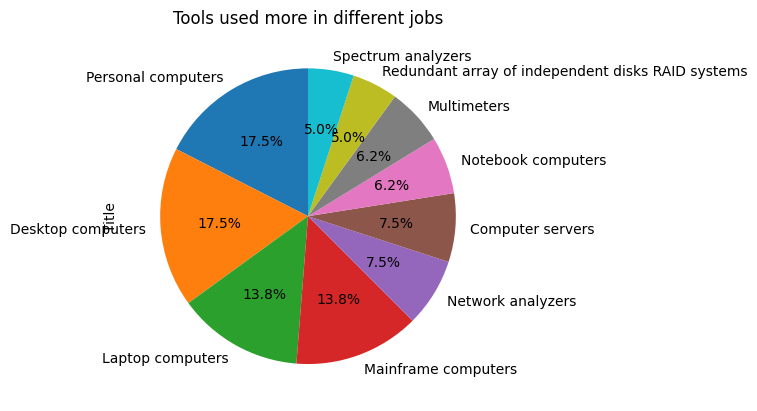

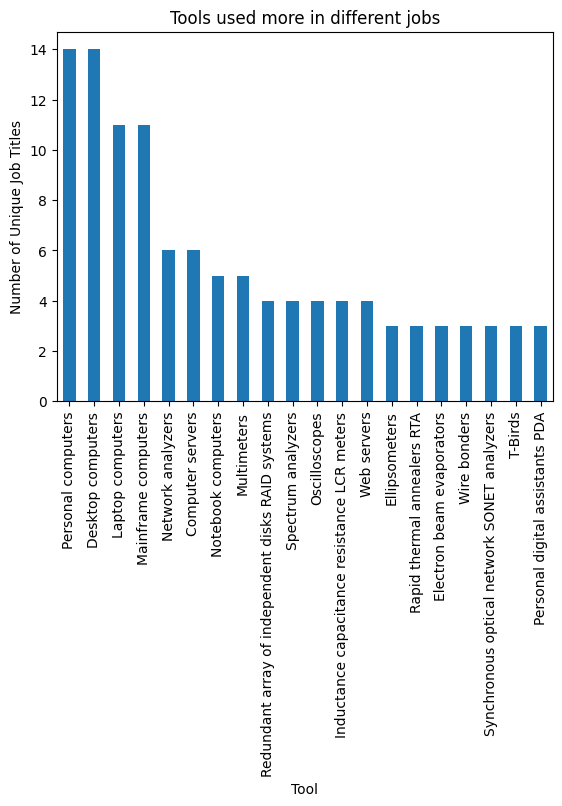

In [581]:
df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\techSkills\software_Tools.xlsx")

grouped_df = df.groupby('Example')['Title'].nunique()
sorted_grouped_df = grouped_df.sort_values(ascending=False)

pie_chart_data = sorted_grouped_df.head(10)
pie_chart_data.plot(kind='pie', autopct='%1.1f%%', startangle=90)
plt.title('Tools used more in different jobs')
plt.show()

bar_chart_data = sorted_grouped_df.head(20)
bar_chart_data.plot(kind='bar')
plt.title('Tools used more in different jobs')
plt.xlabel('Tool')
plt.ylabel('Number of Unique Job Titles')
plt.show()

In [678]:
def print_jobs_for_tools(desired_tool_enter):
    df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\techSkills\software_Tools.xlsx")

    desired_tool = desired_tool_enter

    filtered_df = df[df['Example'] == desired_tool]
    unique_examples = filtered_df['Title'].unique()

    print(f"All Tools required by '{desired_tool}':")
    for example in unique_examples:
        print(example)

In [679]:
print_jobs_for_tools("Personal computers")

All Tools required by 'Personal computers':
computer and information systems managers
quality control systems managers
computer network support specialists
computer network architects
telecommunications engineering specialists
software quality assurance analysts and testers
web developers
web administrators
computer systems engineers/architects
computer hardware engineers
electrical engineers
electronics engineers, except computer
microsystems engineers
sales engineers


In [680]:
print_jobs_for_tools("Desktop computers")

All Tools required by 'Desktop computers':
computer systems analysts
computer network architects
database administrators
network and computer systems administrators
computer programmers
software quality assurance analysts and testers
web developers
web administrators
computer systems engineers/architects
computer hardware engineers
electronics engineers, except computer
robotics engineers
nanosystems engineers
sales engineers


In [681]:
print_jobs_for_tools("Laptop computers")

All Tools required by 'Laptop computers':
quality control systems managers
computer network support specialists
computer network architects
software quality assurance analysts and testers
web developers
web administrators
computer systems engineers/architects
computer hardware engineers
electrical engineers
robotics engineers
sales engineers


In [682]:
print_jobs_for_tools("Mainframe computers")

All Tools required by 'Mainframe computers':
computer and information systems managers
computer systems analysts
computer network support specialists
computer network architects
database administrators
network and computer systems administrators
computer programmers
software quality assurance analysts and testers
computer systems engineers/architects
computer hardware engineers
sales engineers


* **SPLIT THE DATA INTO: TEST AND TRAIN**

In [24]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split

def split_excel_file(folder_name, file_name):
    file_path = os.path.join(folder_name, file_name)

    df = pd.read_excel(file_path)

    train_data, test_val_data = train_test_split(df, test_size=0.2, random_state=42)
    test_data = train_test_split(test_val_data, test_size=0.5, random_state=42)

    train_output_path = os.path.join(folder_name, 'train_' + file_name)
    test_output_path = os.path.join(folder_name, 'test_' + file_name)

    train_data.to_excel(train_output_path, index=False)
    test_data.to_excel(test_output_path, index=False)

    print("Files Created")

In [26]:
folder_name = r"C:\Users\User\Desktop\CardoProject\education\raw"
file_name = "Education, Training, and Experience.xlsx"
split_excel_file(folder_name, file_name)

Files Created


In [27]:
folder_name = r"C:\Users\User\Desktop\CardoProject\knowledges\raw"
file_name = "Knowledge.xlsx"
split_excel_file(folder_name, file_name)

Files Created


In [28]:
folder_name = r"C:\Users\User\Desktop\CardoProject\skills\raw"
file_name = "Skills.xlsx"
split_excel_file(folder_name, file_name)

Files Created


In [31]:
folder_name = r"C:\Users\User\Desktop\CardoProject\techSkills\raw"
file_name = "Technology Skills.xlsx"
split_excel_file(folder_name, file_name)

Files Created


In [32]:
folder_name = r"C:\Users\User\Desktop\CardoProject\techSkills\raw"
file_name = "Tools Used.xlsx"
split_excel_file(folder_name, file_name)

Files Created


In [33]:
folder_name = r"C:\Users\User\Desktop\CardoProject\workActivities\raw"
file_name = "Work Activities.xlsx"
split_excel_file(folder_name, file_name)

Files Created


**MODELS**

* **merge the data for the skills model**

In [5]:

def create_single_files_to_feed_the_model(filepath1, filepath2, filepath3, filepath4):
    processed_skills = pd.read_excel(filepath1)
    skills_to_work_activities = pd.read_excel(filepath2)
    skills_to_work_context = pd.read_excel(filepath3)

    processed_skills["Work Activity"] = None
    processed_skills["Work Context"] = None

    for index, row in processed_skills.iterrows():
        match_activities = skills_to_work_activities[
            (skills_to_work_activities["Skills Element ID"] == row["Element ID"])]
        
        match_context = skills_to_work_context[
            (skills_to_work_context["Skills Element ID"] == row["Element ID"])]

        if not match_activities.empty:
            processed_skills.at[index, "Work Activity"] = match_activities["Work Activities Element Name"].iloc[0]

        if not match_context.empty:
            processed_skills.at[index, "Work Context"] = match_context["Work Context Element Name"].iloc[0]

    processed_skills.to_excel(filepath4, index=False)
    print("Done!")

In [6]:
filepath1 = r"C:\Users\User\Desktop\CardoProject\skills\raw\Skills.xlsx"
filepath2 = r"C:\Users\User\Desktop\CardoProject\skills\raw\Skills to Work Activities.xlsx"
filepath3 = r"C:\Users\User\Desktop\CardoProject\skills\raw\Skills to Work Context.xlsx"
filepath4 = r"C:\Users\User\Desktop\CardoProject\skills\skills_for_pre_trained_models.xlsx"
create_single_files_to_feed_the_model(filepath1, filepath2, filepath3, filepath4)

Done!


In [9]:
filepath1 = r"C:\Users\User\Desktop\CardoProject\train data\train_skills\other\train_Skills.xlsx"
filepath2 = r"C:\Users\User\Desktop\CardoProject\skills\raw\Skills to Work Activities.xlsx"
filepath3 = r"C:\Users\User\Desktop\CardoProject\skills\raw\Skills to Work Context.xlsx"
filepath4 = r"C:\Users\User\Desktop\CardoProject\train data\train_skills\train_Skills_updated.xlsx"
create_single_files_to_feed_the_model(filepath1, filepath2, filepath3, filepath4)

Done!


In [12]:
filepath1 = r"C:\Users\User\Desktop\CardoProject\test data\test_skills\other\test_Skills.xlsx"
filepath2 = r"C:\Users\User\Desktop\CardoProject\skills\raw\Skills to Work Activities.xlsx"
filepath3 = r"C:\Users\User\Desktop\CardoProject\skills\raw\Skills to Work Context.xlsx"
filepath4 = r"C:\Users\User\Desktop\CardoProject\test data\test_skills\test_Skills_updated.xlsx"
create_single_files_to_feed_the_model(filepath1, filepath2, filepath3, filepath4)

Done!


In [6]:
#drop the dublicates
import pandas as pd
def drop_dublicates(inputpath, outputpath):
    df = pd.read_excel(inputpath)

    df_no_duplicates = df.drop_duplicates()

    df_no_duplicates.to_excel(outputpath, index=False)
    print("Dublicates dropped. File saved!")

In [7]:
drop_dublicates(inputpath=r"C:\Users\User\Desktop\CardoProject\train data\train_skills\combined_skills.xlsx",
                outputpath=r"C:\Users\User\Desktop\CardoProject\train data\train_skills\no_dublicates_combined_skills.xlsx")

Dublicates dropped. File saved!


In [8]:
drop_dublicates(inputpath=r"C:\Users\User\Desktop\CardoProject\test data\test_skills\combined_test_skills.xlsx",
                outputpath=r"C:\Users\User\Desktop\CardoProject\test data\test_skills\no_dublicates_combined_test_skills.xlsx")

Dublicates dropped. File saved!


In [124]:
drop_dublicates(inputpath=r"C:\Users\User\Desktop\CardoProject\skills\combined_pre_trained.xlsx",
                outputpath=r"C:\Users\User\Desktop\CardoProject\skills\no_dublicates_combined_pre_trained.xlsx")

Dublicates dropped. File saved!


In [121]:
def concatenate_columns(df):
    df['combined_text'] = df.apply(lambda row: 
        (f"{row['Title']} uses {row['Element Name']} where work activity includes {row['Work Activity']} and work context includes {row['Work Context']}" 
         if pd.notna(row['Work Activity']) and pd.notna(row['Work Context'])
         else f"{row['Title']} uses {row['Element Name']} where work activity includes {row['Work Activity']}" 
              if pd.notna(row['Work Activity'])
              else f"{row['Title']} uses {row['Element Name']} where work context includes {row['Work Context']}" 
                   if pd.notna(row['Work Context'])
                   else f"{row['Title']} don't uses {row['Element Name']} for neither work activity nor work context")
        if pd.notna(row.get('Data Value')) and row['Data Value'] > 2.7
        else None, axis=1)

    df = df.dropna(subset=['combined_text'])
    df = df[['combined_text']]

    return df


In [14]:
import pandas as pd
input_filepath = r"C:\Users\User\Desktop\CardoProject\train data\train_skills\train_Skills_updated.xlsx"

df = pd.read_excel(input_filepath)
df = concatenate_columns(df)

output_filepath = r"C:\Users\User\Desktop\CardoProject\train data\train_skills\combined_skills.xlsx"
df.to_excel(output_filepath, index=False)
print(f"Combined skills file saved in: {output_filepath}")

Combined skills file saved in: C:\Users\User\Desktop\CardoProject\train data\train_skills\combined_skills.xlsx


In [123]:
input_filepath = r"C:\Users\User\Desktop\CardoProject\skills\skills_for_pre_trained_models.xlsx"

df = pd.read_excel(input_filepath)
df = concatenate_columns(df)

output_filepath = r"C:\Users\User\Desktop\CardoProject\skills\combined_pre_trained.xlsx"
df.to_excel(output_filepath, index=False)
print(f"Combined skills file saved in: {output_filepath}")

Combined skills file saved in: C:\Users\User\Desktop\CardoProject\skills\combined_pre_trained.xlsx


In [ ]:
input_filepath = r"C:\Users\User\Desktop\CardoProject\test data\test_skills\test_Skills_updated.xlsx"

df = pd.read_excel(input_filepath)
df = concatenate_columns(df)

output_filepath = r"C:\Users\User\Desktop\CardoProject\test data\test_skills\combined_test_skills.xlsx"
df.to_excel(output_filepath, index=False)
print(f"Combined skills file saved in: {output_filepath}")

In [21]:
def process_text_columns(df, specified_columns):
    df = df.applymap(lambda x: x.lower() if isinstance(x, str) else x)
    df = df.applymap(lambda x: remove_stop_words(x) if isinstance(x,str) else x)
    df = df.applymap(lambda x: remove_punctuation(x) if isinstance(x,str) else x)
    df = df.applymap(lambda x: tokenizeation_process(stem_text(x)) if isinstance(x,str) else x)

    for col in specified_columns:
        if col in df.columns:
            df.dropna(subset=[col], inplace=True)
    return df

def prepare_single_document(file_path, new_path, specified_columns):
    df = pd.read_excel(file_path)
    df = process_text_columns(df, specified_columns)
                
    df.to_excel(new_path, index=False)
    print(f"Processed file saved in: {new_path}")

In [19]:
filepath=r"C:\Users\User\Desktop\CardoProject\train data\train_skills\no_dublicates_combined_skills.xlsx"
new_path=r"C:\Users\User\Desktop\CardoProject\train data\train_skills\not_stemmed_not_dublicate_combined_skills.xlsx"
columns='combined_text'
prepare_single_document(filepath, new_path,columns)

C:\Users\User\AppData\Local\Temp\ipykernel_19100\194416328.py:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: x.lower() if isinstance(x, str) else x)
C:\Users\User\AppData\Local\Temp\ipykernel_19100\194416328.py:3: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: remove_stop_words(x) if isinstance(x,str) else x)
C:\Users\User\AppData\Local\Temp\ipykernel_19100\194416328.py:4: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: remove_punctuation(x) if isinstance(x,str) else x)
C:\Users\User\AppData\Local\Temp\ipykernel_19100\194416328.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: tokenizeation_process(x) if isinstance(x,str) else x)


Processed file saved in: C:\Users\User\Desktop\CardoProject\train data\train_skills\not_stemmed_not_dublicate_combined_skills.xlsx


In [23]:
filepath=r"C:\Users\User\Desktop\CardoProject\train data\train_skills\no_dublicates_combined_skills.xlsx"
new_path=r"C:\Users\User\Desktop\CardoProject\train data\train_skills\stemmed_no_dublicate_combined_skills.xlsx"
columns='combined_text'
prepare_single_document(filepath, new_path,columns)

C:\Users\User\AppData\Local\Temp\ipykernel_19100\3455666766.py:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: x.lower() if isinstance(x, str) else x)
C:\Users\User\AppData\Local\Temp\ipykernel_19100\3455666766.py:3: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: remove_stop_words(x) if isinstance(x,str) else x)
C:\Users\User\AppData\Local\Temp\ipykernel_19100\3455666766.py:4: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: remove_punctuation(x) if isinstance(x,str) else x)
C:\Users\User\AppData\Local\Temp\ipykernel_19100\3455666766.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: tokenizeation_process(stem_text(x)) if isinstance(x,str) else x)


Processed file saved in: C:\Users\User\Desktop\CardoProject\train data\train_skills\stemmed_bo_dublicate_combined_skills.xlsx


In [24]:
filepath=r"C:\Users\User\Desktop\CardoProject\test data\test_skills\no_dublicates_combined_test_skills.xlsx"
new_path=r"C:\Users\User\Desktop\CardoProject\test data\test_skills\stemmed_no_dublicate_combined_test_skills.xlsx"
columns='combined_text'
prepare_single_document(filepath, new_path,columns)

C:\Users\User\AppData\Local\Temp\ipykernel_19100\3455666766.py:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: x.lower() if isinstance(x, str) else x)
C:\Users\User\AppData\Local\Temp\ipykernel_19100\3455666766.py:3: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: remove_stop_words(x) if isinstance(x,str) else x)
C:\Users\User\AppData\Local\Temp\ipykernel_19100\3455666766.py:4: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: remove_punctuation(x) if isinstance(x,str) else x)
C:\Users\User\AppData\Local\Temp\ipykernel_19100\3455666766.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: tokenizeation_process(stem_text(x)) if isinstance(x,str) else x)


Processed file saved in: C:\Users\User\Desktop\CardoProject\test data\test_skills\stemmed_no_dublicate_combined_test_skills.xlsx


In [20]:
filepath=r"C:\Users\User\Desktop\CardoProject\test data\test_skills\no_dublicates_combined_test_skills.xlsx"
new_path=r"C:\Users\User\Desktop\CardoProject\test data\test_skills\not_stemmed_no_dublicate_combined_test_skills.xlsx"
columns='combined_text'
prepare_single_document(filepath, new_path,columns)

C:\Users\User\AppData\Local\Temp\ipykernel_19100\194416328.py:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: x.lower() if isinstance(x, str) else x)
C:\Users\User\AppData\Local\Temp\ipykernel_19100\194416328.py:3: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: remove_stop_words(x) if isinstance(x,str) else x)
C:\Users\User\AppData\Local\Temp\ipykernel_19100\194416328.py:4: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: remove_punctuation(x) if isinstance(x,str) else x)
C:\Users\User\AppData\Local\Temp\ipykernel_19100\194416328.py:5: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: tokenizeation_process(x) if isinstance(x,str) else x)


Processed file saved in: C:\Users\User\Desktop\CardoProject\test data\test_skills\not_stemmed_no_dublicate_combined_test_skills.xlsx


#STEMMED DATASET

In [317]:
import pandas as pd
from ast import literal_eval
from collections import Counter

excel_file_path = r"C:\Users\User\Desktop\CardoProject\train data\train_skills\stemmed_no_dublicate_combined_skills.xlsx"
df = pd.read_excel(excel_file_path)
text_data = df['combined_text'].apply(literal_eval).tolist()

tokens = [word for sentence in text_data for word in sentence]
min_count_threshold = 1  
word_counts = Counter(tokens)
vocabulary = [word for word, count in word_counts.items() if count >= min_count_threshold]
print(word_counts)

print("Vocabulary Size:", len(vocabulary))
print("Sample Vocabulary:", vocabulary[:10])

Counter({'work': 55319, 'includ': 42906, 'activ': 32707, 'use': 31008, 'context': 18415, 'equip': 9248, 'inform': 6894, 'oper': 5401, 'manag': 4965, 'materi': 4462, 'repair': 4440, 'other': 4191, 'decis': 4181, 'make': 4181, 'product': 3806, 'coordin': 3483, 'monitor': 3389, 'estim': 3371, 'event': 3371, 'solv': 3361, 'problem': 3361, 'speak': 3350, 'strategi': 3349, 'quantifi': 3339, 'characterist': 3339, 'mechan': 3098, 'control': 2812, 'process': 2718, 'develop': 2677, 'resourc': 2635, 'public': 2579, 'group': 2548, 'team': 2548, 'analysi': 2542, 'maintain': 2525, 'lead': 2516, 'object': 2510, 'get': 2508, 'neither': 2500, 'machin': 2315, 'system': 2104, 'technician': 2081, 'engin': 1983, 'electron': 1946, 'worker': 1884, 'mail': 1847, 'vehicl': 1843, 'commun': 1811, 'structur': 1791, 'servic': 1720, 'inspect': 1692, 'think': 1688, 'consequ': 1680, 'error': 1680, 'updat': 1679, 'relev': 1679, 'knowledg': 1679, 'schedul': 1678, 'surround': 1677, 'open': 1675, 'peopl': 1675, 'outsid':

* CBOW version

In [318]:
from gensim.models import Word2Vec

window_size = 10
min_count = 2
vector_size = 100
epochs=10

model = Word2Vec(
    sentences=text_data,
    window=window_size,
    vector_size=vector_size,
    min_count=min_count,
    sg=0,
    negative=10
)

model.train(text_data, total_examples=len(text_data), epochs=epochs)

(2359918, 4684380)

In [319]:
model.wv.similarity("web", "develop")

-0.52554

In [320]:
model.wv.most_similar("web", topn=10)

[('databas', 0.6668543815612793),
 ('train', 0.6424989104270935),
 ('secretari', 0.6404547095298767),
 ('execut', 0.520504355430603),
 ('daycar', 0.48861318826675415),
 ('legal', 0.4654112160205841),
 ('preschool', 0.4633951783180237),
 ('kindergarten', 0.43681156635284424),
 ('biofuelsbiodiesel', 0.4247942268848419),
 ('adjud', 0.4221298396587372)]

In [321]:
model.save("stemmed-CBOW.model")

* Skip-gram version

In [322]:
from gensim.models import Word2Vec

window_size = 10
min_count = 2
vector_size = 100
epochs=10

model_sg = Word2Vec(
    sentences=text_data,
    window=window_size,
    vector_size=vector_size,
    min_count=min_count,
    sg=1,
    negative=10
)

model_sg.train(text_data, total_examples=len(text_data), epochs=epochs)

(2361000, 4684380)

In [323]:
model_sg.wv.similarity("web", "develop")

0.06358841

In [324]:
model_sg.wv.most_similar("web", topn=10)

[('boilermak', 0.761188268661499),
 ('urologist', 0.7606616020202637),
 ('pharmacist', 0.7439843416213989),
 ('databas', 0.7279111742973328),
 ('daycar', 0.7215521931648254),
 ('telemarket', 0.720759928226471),
 ('physicist', 0.7179620862007141),
 ('secretari', 0.7101821899414062),
 ('nanni', 0.7013275623321533),
 ('podiatrist', 0.7011468410491943)]

In [325]:
model_sg.save("stemmed-skipGram.model")

* **TEST CBOW-model on stemmed dataset**

In [326]:

import pandas as pd
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import plotly.express as px
import numpy as np
from gensim.models import Word2Vec

model_path = r"C:\Users\User\Desktop\CardoProject\stemmed-CBOW.model"
loaded_model = Word2Vec.load(model_path)

df_test = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\test data\test_skills\stemmed_no_dublicate_combined_test_skills.xlsx")
tokenized_sentences = df_test['combined_text'].apply(eval).tolist()

vectors = []
unique_words_set = set()
for sentence in tokenized_sentences:
    for word in sentence:
        if word in loaded_model.wv and word not in unique_words_set:
            vectors.append(loaded_model.wv[word])
            unique_words_set.add(word)

word_vectors_2d = np.array(vectors)

pca = PCA(n_components=2)
vectors_2d = pca.fit_transform(word_vectors_2d)

kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(vectors_2d)

df_visualization = pd.DataFrame({'Word': list(unique_words_set),
                                  'Cluster': clusters,
                                  'X': vectors_2d[:, 0],
                                  'Y': vectors_2d[:, 1]})

fig = px.scatter(df_visualization, x='X', y='Y', color='Cluster',  title='Word Clusters Visualization (CBOW) - stemmed dataset')
fig.update_traces(textposition='top center')
fig.show()

k: 1, value: 13180.294921875
k: 2, value: 9136.3740234375
k: 3, value: 7054.72412109375
k: 4, value: 5425.4951171875
k: 5, value: 4615.97607421875
k: 6, value: 3788.782958984375
k: 7, value: 3254.99560546875
k: 8, value: 2766.302001953125
k: 9, value: 2482.90625
k: 10, value: 2263.291015625


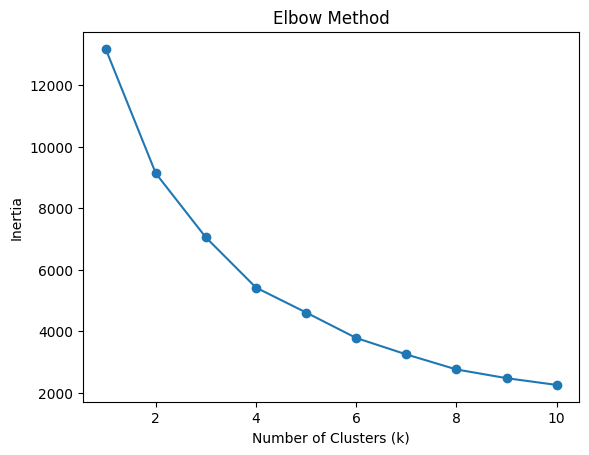

In [327]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

inertias = []

for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(vectors_2d)
    inertias.append(kmeans.inertia_)
    print(f"k: {k}, value: {kmeans.inertia_}")

plt.plot(range(1, 11), inertias, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

k:2, value:0.5163145661354065
k:3, value:0.33513930439949036
k:4, value:0.33110952377319336
k:5, value:0.33733436465263367
k:6, value:0.3452800214290619
k:7, value:0.33586472272872925
k:8, value:0.3498210906982422
k:9, value:0.35647451877593994
k:10, value:0.35254985094070435


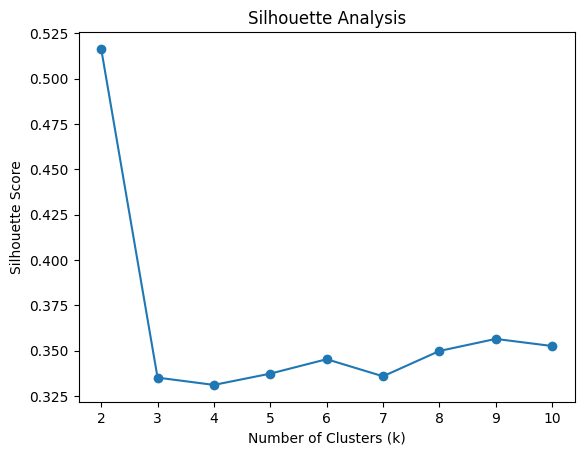

In [328]:
from sklearn.metrics import silhouette_score

silhouette_scores = []

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(vectors_2d)
    silhouette_avg = silhouette_score(vectors_2d, labels)
    silhouette_scores.append(silhouette_avg)
    print(f"k:{k}, value:{silhouette_avg}")

plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('Silhouette Analysis')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.show()

In [332]:
def check_cluster(word, enter_df):
    target_word = word
    visualization_df = enter_df

    word_index = visualization_df.index[visualization_df['Word'] == target_word].tolist()

    if word_index:
        cluster_label = df_visualization.loc[word_index[0], 'Cluster']
        print(f"The cluster label for '{target_word}' is: {cluster_label}")
    else:
        print(f"'{target_word}' not found in the DataFrame.")


In [333]:
check_cluster("web", enter_df=df_visualization)
check_cluster("develop", enter_df=df_visualization)

The cluster label for 'web' is: 1
The cluster label for 'develop' is: 1


* **TEST SKIP-GRAM model on stemmed dataset**

In [337]:

import pandas as pd
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import plotly.express as px
import numpy as np
from gensim.models import Word2Vec

model_path_sg = r"C:\Users\User\Desktop\CardoProject\stemmed-skipGram.model"
loaded_model_sg = Word2Vec.load(model_path_sg)

df_test_sg = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\test data\test_skills\stemmed_no_dublicate_combined_test_skills.xlsx")
tokenized_sentences_sg = df_test_sg['combined_text'].apply(eval).tolist()

vectors_sg = []
unique_words_set_sg = set()
for sentence in tokenized_sentences_sg:
    for word in sentence:
        if word in loaded_model.wv and word not in unique_words_set_sg:
            vectors_sg.append(loaded_model_sg.wv[word])
            unique_words_set_sg.add(word)

word_vectors_2d_sg = np.array(vectors_sg)

pca = PCA(n_components=2)
vectors_2d_sg = pca.fit_transform(word_vectors_2d_sg)

kmeans_sg = KMeans(n_clusters=3, random_state=42)
clusters_sg = kmeans_sg.fit_predict(vectors_2d_sg)

df_visualization_sg = pd.DataFrame({'Word': list(unique_words_set_sg),
                                  'Cluster': clusters_sg,
                                  'X': vectors_2d_sg[:, 0],
                                  'Y': vectors_2d_sg[:, 1]})

fig = px.scatter(df_visualization_sg, x='X', y='Y', color='Cluster', title='Word Clusters Visualization (Skip-Gram) - stemmed dataset')
fig.update_traces(textposition='top center')
fig.show()

k: 1, value: 11800.610057726144
k: 2, value: 11387.689645298513
k: 3, value: 10946.383254264734
k: 4, value: 10562.148896543922
k: 5, value: 10316.464636984643
k: 6, value: 10091.526244235642
k: 7, value: 9876.953228650535
k: 8, value: 9731.865139002128
k: 9, value: 9548.362816877385
k: 10, value: 9412.558714954093


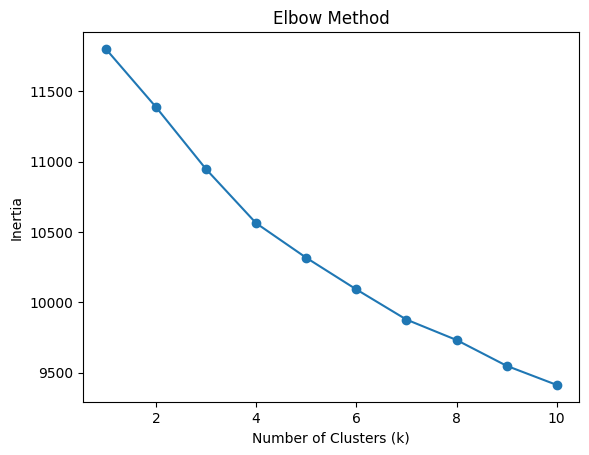

In [335]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

inertias_sg = []

for k in range(1, 11):
    kmeans_sg = KMeans(n_clusters=k, random_state=42)
    kmeans_sg.fit(vectors_sg)
    inertias_sg.append(kmeans_sg.inertia_)
    print(f"k: {k}, value: {kmeans_sg.inertia_}")

plt.plot(range(1, 11), inertias_sg, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

k:2, value:0.33025962114334106
k:3, value:0.39596349000930786
k:4, value:0.3686351776123047
k:5, value:0.3744596838951111
k:6, value:0.36822912096977234
k:7, value:0.3257662355899811
k:8, value:0.37854206562042236
k:9, value:0.37895211577415466
k:10, value:0.34888267517089844


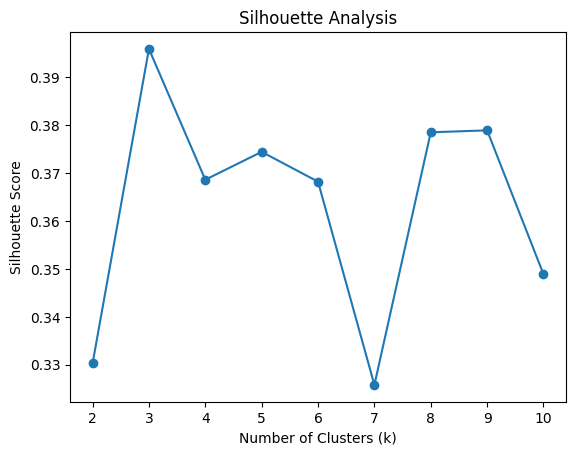

In [336]:
silhouette_scores_sg = []

for k in range(2, 11):
    kmeans_sg = KMeans(n_clusters=k, random_state=42)
    labels_sg = kmeans_sg.fit_predict(vectors_2d_sg)
    silhouette_avg_sg = silhouette_score(vectors_2d_sg, labels_sg)
    silhouette_scores_sg.append(silhouette_avg_sg)
    print(f"k:{k}, value:{silhouette_avg_sg}")

plt.plot(range(2, 11), silhouette_scores_sg, marker='o')
plt.title('Silhouette Analysis')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.show()

In [343]:
check_cluster("web", enter_df=df_visualization_sg)
check_cluster("develop", enter_df=df_visualization_sg)

The cluster label for 'web' is: 1
The cluster label for 'develop' is: 1


#WITHOUT STEMMING:


In [344]:
from ast import literal_eval
from collections import Counter

file_path_not_stemmed = r"C:\Users\User\Desktop\CardoProject\train data\train_skills\not_stemmed_not_dublicate_combined_skills.xlsx"
df_not_stemmed = pd.read_excel(file_path_not_stemmed)
text_data_not_stemmed = df_not_stemmed['combined_text'].apply(literal_eval).tolist()

tokens_not_stemmed = [word for sentence in text_data_not_stemmed for word in sentence]
min_count_threshold = 1  
word_counts_not_stemmed = Counter(tokens_not_stemmed)
vocabulary_not_stemmed = [word for word, count in word_counts_not_stemmed.items() if count >= min_count_threshold]
print(word_counts_not_stemmed)

print("Vocabulary Size:", len(vocabulary_not_stemmed))
print("Sample Vocabulary:", vocabulary_not_stemmed[:10])

Counter({'work': 54481, 'includes': 42744, 'uses': 29329, 'activity': 29329, 'context': 18415, 'equipment': 9248, 'information': 6894, 'others': 4191, 'products': 3543, 'materials': 3534, 'management': 3479, 'monitoring': 3389, 'repairing': 3366, 'solving': 3361, 'speaking': 3350, 'making': 3349, 'strategies': 3349, 'decisions': 3347, 'estimating': 3339, 'quantifiable': 3339, 'characteristics': 3339, 'events': 3339, 'mechanical': 2726, 'operators': 2657, 'resources': 2602, 'public': 2579, 'group': 2548, 'team': 2548, 'analysis': 2542, 'maintaining': 2525, 'coordinate': 2516, 'lead': 2516, 'processes': 2515, 'problems': 2515, 'developing': 2510, 'objectives': 2510, 'getting': 2508, 'neither': 2500, 'technicians': 2081, 'systems': 2003, 'workers': 1884, 'mail': 1847, 'control': 1842, 'operations': 1840, 'electronic': 1777, 'vehicle': 1776, 'activities': 1713, 'inspecting': 1692, 'structures': 1692, 'thinking': 1688, 'consequence': 1680, 'error': 1680, 'updating': 1679, 'using': 1679, 're

* CBOW version

In [345]:
from gensim.models import Word2Vec

window_size = 10
min_count = 2
vector_size = 100
epochs=10

model_not_stemmed = Word2Vec(
    sentences=text_data_not_stemmed,
    window=window_size,
    vector_size=vector_size,
    min_count=min_count,
    sg=0,
    negative=10
)

model_not_stemmed.train(text_data_not_stemmed, total_examples=len(text_data_not_stemmed), epochs=epochs)

(2521352, 4684380)

In [346]:
model_not_stemmed.wv.similarity("web", "developers")

0.0103142345

In [347]:
model_not_stemmed.wv.most_similar("web", topn=10)

[('database', 0.8716518878936768),
 ('preschool', 0.7486947774887085),
 ('selfenrichment', 0.6683599352836609),
 ('kindergarten', 0.6579522490501404),
 ('daycare', 0.6446510553359985),
 ('network', 0.5594621896743774),
 ('middle', 0.5397886037826538),
 ('secondary', 0.5366361141204834),
 ('industrialorganizational', 0.5244523286819458),
 ('school', 0.5074606537818909)]

In [348]:
model_not_stemmed.save("notStemmed-CBOW.model")

Skip-gram version

In [364]:
from gensim.models import Word2Vec

window_size = 10
min_count = 2
vector_size = 100
epochs=10

model_not_stemmed_sg = Word2Vec(
    sentences=text_data_not_stemmed,
    window=window_size,
    vector_size=vector_size,
    min_count=min_count,
    sg=1,
    negative=10
)

model_not_stemmed_sg.train(text_data_not_stemmed, total_examples=len(text_data_not_stemmed), epochs=epochs)

(2520392, 4684380)

In [363]:
model_not_stemmed_sg.wv.similarity("web", "developers")

0.7007256

In [356]:
model_not_stemmed_sg.wv.most_similar("web", topn=10)

[('developers', 0.7762749791145325),
 ('database', 0.7575903534889221),
 ('daycare', 0.696221649646759),
 ('kindergarten', 0.6772086024284363),
 ('microbiologists', 0.6588995456695557),
 ('bailiffs', 0.6419467329978943),
 ('phlebotomists', 0.6401885151863098),
 ('concierges', 0.6367190480232239),
 ('childcare', 0.6329022645950317),
 ('telemarketers', 0.6313817501068115)]

In [357]:
model_not_stemmed_sg.save("notStemmed-skipGram.model")

* **TEST CBOW model in non-stemmed dataset**

In [352]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import plotly.express as px
import numpy as np
from gensim.models import Word2Vec

model_path_not_stemmed = r"C:\Users\User\Desktop\CardoProject\notStemmed-CBOW.model"
loaded_model_not_stemmed = Word2Vec.load(model_path_not_stemmed)

df_test_not_stemmed = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\test data\test_skills\not_stemmed_no_dublicate_combined_test_skills.xlsx")
tokenized_sentences_not_stemmed = df_test_not_stemmed['combined_text'].apply(eval).tolist()

vectors_not_stemmed = []
unique_words_set_not_stemmed = set()
for sentence in tokenized_sentences_not_stemmed:
    for word in sentence:
        if word in loaded_model_not_stemmed.wv and word not in unique_words_set_not_stemmed:
            vectors_not_stemmed.append(loaded_model_not_stemmed.wv[word])
            unique_words_set_not_stemmed.add(word)

word_vectors_2d_not_stemmed = np.array(vectors_not_stemmed)

pca = PCA(n_components=2)
vectors_2d_not_stemmed = pca.fit_transform(word_vectors_2d_not_stemmed)

kmeans_not_stemmed = KMeans(n_clusters=2, random_state=42)
clusters_not_stemmed = kmeans_not_stemmed.fit_predict(vectors_2d_not_stemmed)

df_visualization_not_stemmed = pd.DataFrame({'Word': list(unique_words_set_not_stemmed),
                                  'Cluster': clusters_not_stemmed,
                                  'X': vectors_2d_not_stemmed[:, 0],
                                  'Y': vectors_2d_not_stemmed[:, 1]})

fig_not_stemmed = px.scatter(df_visualization_not_stemmed, x='X', y='Y', color='Cluster',  title='Word Clusters Visualization (CBOW) - not stemmed dataset')
fig_not_stemmed.update_traces(textposition='top center')
fig_not_stemmed.show()

k: 1, value: 146845.46288467682
k: 2, value: 141562.2088248934
k: 3, value: 139706.7289011958
k: 4, value: 137153.11644668065
k: 5, value: 131957.1519643868
k: 6, value: 128986.57953377147
k: 7, value: 127918.60701004748
k: 8, value: 128912.91535457289
k: 9, value: 128154.45198542373
k: 10, value: 127813.4727127554


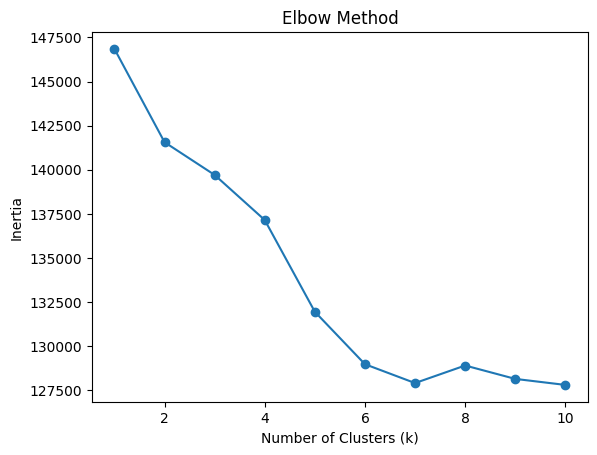

In [350]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

inertias_not_stemmed = []

for k in range(1, 11):
    kmeans_not_stemmed = KMeans(n_clusters=k, random_state=42)
    kmeans_not_stemmed.fit(vectors_not_stemmed)
    inertias_not_stemmed.append(kmeans_not_stemmed.inertia_)
    print(f"k: {k}, value: {kmeans_not_stemmed.inertia_}")

plt.plot(range(1, 11), inertias_not_stemmed, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

k:2, value:0.6604325771331787
k:3, value:0.3888319730758667
k:4, value:0.3576095998287201
k:5, value:0.3924523591995239
k:6, value:0.33341044187545776
k:7, value:0.3703138530254364
k:8, value:0.34575963020324707
k:9, value:0.3547426760196686
k:10, value:0.3521122932434082


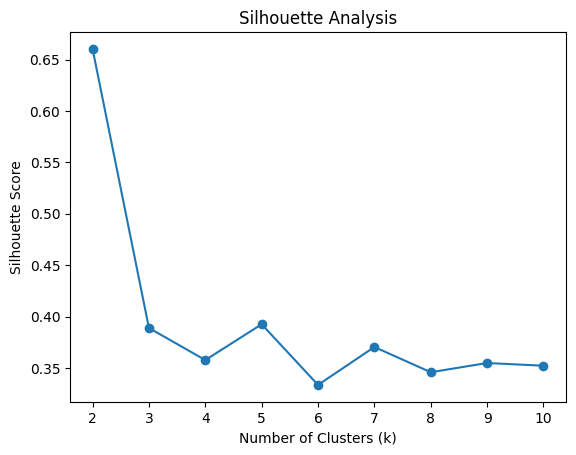

In [351]:
silhouette_scores_not_stemmed = []

for k in range(2, 11):
    kmeans_not_stemmed = KMeans(n_clusters=k, random_state=42)
    labels= kmeans_not_stemmed.fit_predict(vectors_2d_not_stemmed)
    silhouette_avg_not_stemmed = silhouette_score(vectors_2d_not_stemmed, labels)
    silhouette_scores_not_stemmed.append(silhouette_avg_not_stemmed)
    print(f"k:{k}, value:{silhouette_avg_not_stemmed}")

plt.plot(range(2, 11), silhouette_scores_not_stemmed, marker='o')
plt.title('Silhouette Analysis')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.show()

In [353]:
check_cluster("web", enter_df=df_visualization_not_stemmed)
check_cluster("developers", enter_df=df_visualization_not_stemmed)

The cluster label for 'web' is: 1
The cluster label for 'developers' is: 1


* **TEST SKIP-GRAM model in non-stemmed dataset**

In [358]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import plotly.express as px
import numpy as np
from gensim.models import Word2Vec

model_path_not_stemmed_sg = r"C:\Users\User\Desktop\CardoProject\notStemmed-skipGram.model"
loaded_model_not_stemmed_sg = Word2Vec.load(model_path_not_stemmed_sg)

df_test_not_stemmed_sg = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\test data\test_skills\not_stemmed_no_dublicate_combined_test_skills.xlsx")
tokenized_sentences_not_stemmed_sg = df_test_not_stemmed_sg['combined_text'].apply(eval).tolist()

vectors_not_stemmed_sg = []
unique_words_set_not_stemmed_sg = set()
for sentence in tokenized_sentences_not_stemmed_sg:
    for word in sentence:
        if word in loaded_model_not_stemmed_sg.wv and word not in unique_words_set_not_stemmed_sg:
            vectors_not_stemmed_sg.append(loaded_model_not_stemmed_sg.wv[word])
            unique_words_set_not_stemmed_sg.add(word)

word_vectors_2d_not_stemmed_sg = np.array(vectors_not_stemmed_sg)

pca = PCA(n_components=2)
vectors_2d_not_stemmed_sg = pca.fit_transform(word_vectors_2d_not_stemmed_sg)

kmeans_not_stemmed_sg = KMeans(n_clusters=3, random_state=42)
clusters_not_stemmed_sg = kmeans_not_stemmed_sg.fit_predict(vectors_2d_not_stemmed_sg)

df_visualization_not_stemmed_sg = pd.DataFrame({'Word': list(unique_words_set_not_stemmed_sg),
                                'Cluster': clusters_not_stemmed_sg,
                                'X': vectors_2d_not_stemmed_sg[:, 0],
                                'Y': vectors_2d_not_stemmed_sg[:, 1]})

fig_not_stemmed_sg = px.scatter(df_visualization_not_stemmed_sg, x='X', y='Y', color='Cluster',  title='Word Clusters Visualization (Skip-Gram) - not stemmed dataset')
fig_not_stemmed_sg.update_traces(textposition='top center')
fig_not_stemmed_sg.show()

k: 1, value: 13833.99277811357
k: 2, value: 13229.366790200973
k: 3, value: 12653.089255938023
k: 4, value: 12282.482952476958
k: 5, value: 11956.061062930716
k: 6, value: 11902.137281096775
k: 7, value: 11622.702509107605
k: 8, value: 11263.019971985805
k: 9, value: 11080.582177440121
k: 10, value: 10938.612076504804


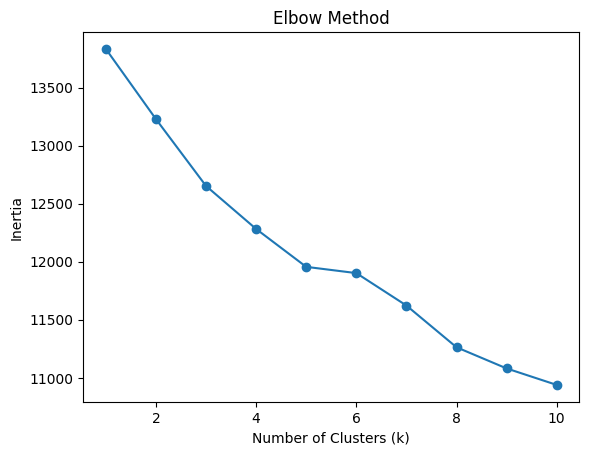

In [359]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

inertias_not_stemmed_sg = []

for k in range(1, 11):
    kmeans_not_stemmed_sg = KMeans(n_clusters=k, random_state=42)
    kmeans_not_stemmed_sg.fit(vectors_not_stemmed_sg)
    inertias_not_stemmed_sg.append(kmeans_not_stemmed_sg.inertia_)
    print(f"k: {k}, value: {kmeans_not_stemmed_sg.inertia_}")

plt.plot(range(1, 11), inertias_not_stemmed_sg, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

k:2, value:0.46534234285354614
k:3, value:0.5815098285675049
k:4, value:0.3982803225517273
k:5, value:0.38826513290405273
k:6, value:0.41430506110191345
k:7, value:0.39696550369262695
k:8, value:0.39716729521751404
k:9, value:0.3568595051765442
k:10, value:0.37182551622390747


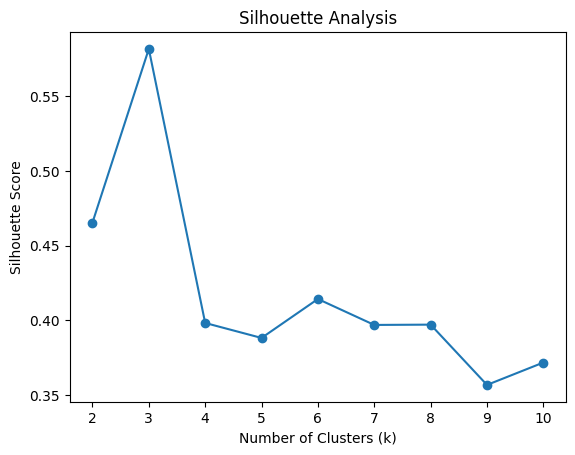

In [360]:
silhouette_scores_not_stemmed_sg = []

for k in range(2, 11):
    kmeans_not_stemmed_sg = KMeans(n_clusters=k, random_state=42)
    labels_not_stemmed_sg = kmeans_not_stemmed_sg.fit_predict(vectors_2d_not_stemmed_sg)
    silhouette_avg_not_stemmed_sg = silhouette_score(vectors_2d_not_stemmed_sg, labels_not_stemmed_sg)
    silhouette_scores_not_stemmed_sg.append(silhouette_avg_not_stemmed_sg)
    print(f"k:{k}, value:{silhouette_avg_not_stemmed_sg}")

plt.plot(range(2, 11), silhouette_scores_not_stemmed_sg, marker='o')
plt.title('Silhouette Analysis')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.show()

In [1]:
check_cluster("web", enter_df=df_visualization_not_stemmed_sg)
check_cluster("developers", enter_df=df_visualization_not_stemmed_sg)

The cluster label for 'web' is: 2
The cluster label for 'developers' is: 2


* **USAGE OF PRE-TRAINED MODELS**

In [143]:
from sentence_transformers import SentenceTransformer
import pandas as pd

pre_trained_model_df = pd.read_excel(r"C:\Users\User\Desktop\CardoProject\test data\test_skills\no_dublicates_combined_pre_trained.xlsx")

pre_trained_model = SentenceTransformer('sentence-transformers/all-MiniLM-L12-v2')

pre_trained_sentences = pre_trained_model_df['combined_text'].tolist()

pre_trained_embeddings = pre_trained_model.encode(pre_trained_sentences)

print("Embeddings of the sentences computed successfully!")

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

C:\Users\User\AppData\Roaming\Python\Python311\site-packages\huggingface_hub\file_download.py:149: UserWarning:

`huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\User\.cache\huggingface\hub\models--sentence-transformers--all-MiniLM-L12-v2. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to see activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development



config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.7k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/573 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/134M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/352 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Embeddings of the sentences computed successfully!


In [222]:
phrase_list = ['programming jobs','software', 'programming', 'developer','coding', 'web developers', 'software app', 'computer system', 'computer program', 'administrator', 'computer application', 'programmer', 'videogame']
phrase_embeddings = pre_trained_model.encode(phrase_list)

In [266]:
from sklearn.metrics.pairwise import cosine_similarity

threshold = 0.4

related_sentences_indices = []
for phrase_embedding in phrase_embeddings:
    cosine_similarities = cosine_similarity([phrase_embedding], pre_trained_embeddings)[0]
    related_sentences_indices.extend([i for i, sim in enumerate(cosine_similarities) if sim > threshold])

related_sentences_indices = list(set(related_sentences_indices))

related_sentences = [pre_trained_sentences[i] for i in related_sentences_indices]
related_sentences_df = pd.DataFrame({'related_sentences': related_sentences})

num_related_sentences = len(related_sentences_indices)
print("Number of related sentences:", num_related_sentences)

print("\nTop 20 related sentences:")
for i in range(min(20, num_related_sentences)):
    print(f"{i + 1}. {related_sentences[i]}")

Number of related sentences: 478

Top 20 related sentences:
1. Chief Executives uses Systems Evaluation where work activity includes Making Decisions and Solving Problems
2. Engine and Other Machine Assemblers uses Complex Problem Solving where work activity includes Making Decisions and Solving Problems and work context includes Consequence of Error
3. Chief Sustainability Officers uses Systems Evaluation where work activity includes Making Decisions and Solving Problems
4. Computer Systems Analysts uses Reading Comprehension where work activity includes Getting Information and work context includes Electronic Mail
5. Computer Systems Analysts uses Mathematics where work activity includes Estimating the Quantifiable Characteristics of Products, Events, or Information
6. Computer Systems Analysts uses Active Learning where work activity includes Making Decisions and Solving Problems and work context includes Freedom to Make Decisions
7. Computer Systems Analysts uses Learning Strategie

In [367]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import plotly.express as px

pre_trained_pca = PCA(n_components=2)
pre_trained_2d_vectors = pre_trained_pca.fit_transform(pre_trained_embeddings)

pre_trained_kmeans = KMeans(n_clusters=3, random_state=42)
pre_trained_clusters = pre_trained_kmeans.fit_predict(pre_trained_2d_vectors)

pre_trained_visualization_df = pd.DataFrame({
    'Sentence': list(pre_trained_sentences), 'Cluster': pre_trained_clusters,
    'X': pre_trained_2d_vectors[:, 0], 'Y': pre_trained_2d_vectors[:, 1]
})

pre_train_fig = px.scatter(
    pre_trained_visualization_df,
    x='X',
    y='Y',
    color='Cluster',
    title='Sentence Visualization using pre-trained model',
    hover_name='Sentence',
)

pre_train_fig.update_traces(textposition='top center')
pre_train_fig.show()

k: 1, value: 1429.6964111328125
k: 2, value: 817.3295288085938
k: 3, value: 423.938720703125
k: 4, value: 311.38275146484375
k: 5, value: 247.78936767578125
k: 6, value: 212.7822265625
k: 7, value: 185.98963928222656
k: 8, value: 166.64320373535156
k: 9, value: 140.2650909423828
k: 10, value: 125.56587219238281


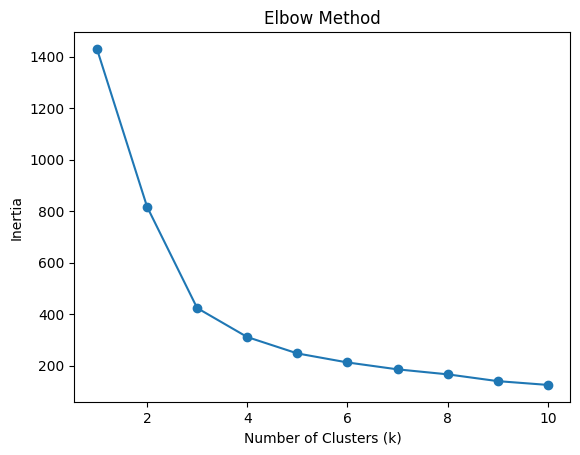

In [271]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

inertias_pre_trained = []

for k in range(1, 11):
    kmeans_pre_trained_elbow = KMeans(n_clusters=k, random_state=42)
    kmeans_pre_trained_elbow.fit(pre_trained_2d_vectors)
    inertias_pre_trained.append(kmeans_pre_trained_elbow.inertia_)
    print(f"k: {k}, value: {kmeans_pre_trained_elbow.inertia_}")

plt.plot(range(1, 11), inertias_pre_trained, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

k:2, value:[0.3877469]
k:3, value:[0.3877469, 0.47133848]
k:4, value:[0.3877469, 0.47133848, 0.42578074]
k:5, value:[0.3877469, 0.47133848, 0.42578074, 0.4212056]
k:6, value:[0.3877469, 0.47133848, 0.42578074, 0.4212056, 0.38744104]
k:7, value:[0.3877469, 0.47133848, 0.42578074, 0.4212056, 0.38744104, 0.38184968]
k:8, value:[0.3877469, 0.47133848, 0.42578074, 0.4212056, 0.38744104, 0.38184968, 0.37036365]
k:9, value:[0.3877469, 0.47133848, 0.42578074, 0.4212056, 0.38744104, 0.38184968, 0.37036365, 0.3715386]
k:10, value:[0.3877469, 0.47133848, 0.42578074, 0.4212056, 0.38744104, 0.38184968, 0.37036365, 0.3715386, 0.3742448]


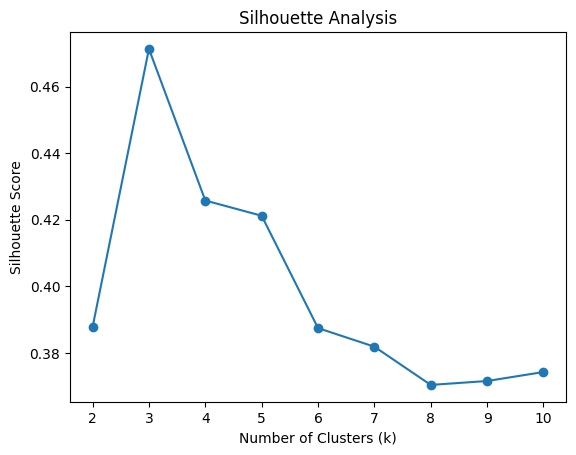

In [277]:
silhouette_scores_pre_trained = []

for k in range(2, 11):
    kmeans_pre_trained = KMeans(n_clusters=k, random_state=42)
    labels_pre_trained = kmeans_pre_trained.fit_predict(pre_trained_2d_vectors)
    silhouette_avg_pre_trained = silhouette_score(pre_trained_2d_vectors, labels_pre_trained)
    silhouette_scores_pre_trained.append(silhouette_avg_pre_trained)
    print(f"k:{k}, value:{silhouette_scores_pre_trained}")

plt.plot(range(2, 11), silhouette_scores_pre_trained, marker='o')
plt.title('Silhouette Analysis')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.show()

In [399]:
pre_trained_visualization_df = pd.DataFrame({
    'Sentence': list(pre_trained_sentences),
    'Cluster': pre_trained_clusters,
    'X': pre_trained_2d_vectors[:, 0],
    'Y': pre_trained_2d_vectors[:, 1],
})

pre_trained_visualization_df['Marked'] = 'Blue' 
pre_trained_visualization_df.loc[related_sentences_indices, 'Marked'] = 'Red'

pre_train_fig_2 = px.scatter(
    pre_trained_visualization_df,
    x='X',
    y='Y',
    color='Marked',
    title='Sentence Visualization using pre-trained model',
    hover_name='Sentence',
)

pre_train_fig_2.update_traces(textposition='top center')
pre_train_fig_2.show()

**THANK YOU**